# Consumer beahvior and shopping habits

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from category_encoders import BinaryEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
import gower
from sklearn_extra.cluster import KMedoids
from kmodes.kprototypes import KPrototypes
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.linear_model import LogisticRegression
#from kmodes.kmodes import KModes

pd.options.display.float_format = '{:.3f}'.format
pd.options.display.max_columns = None
plt.style.use("fivethirtyeight")


## Učitavanje podataka

In [2]:
dataset_url = "./datasets/shopping/shopping_behavior_updated.csv"

df = pd.read_csv(dataset_url, sep=",")
df.head(10)

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.100,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.100,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.100,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.500,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.700,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually
5,6,46,Male,Sneakers,Footwear,20,Wyoming,M,White,Summer,2.900,Yes,Standard,Yes,Yes,14,Venmo,Weekly
6,7,63,Male,Shirt,Clothing,85,Montana,M,Gray,Fall,3.200,Yes,Free Shipping,Yes,Yes,49,Cash,Quarterly
7,8,27,Male,Shorts,Clothing,34,Louisiana,L,Charcoal,Winter,3.200,Yes,Free Shipping,Yes,Yes,19,Credit Card,Weekly
8,9,26,Male,Coat,Outerwear,97,West Virginia,L,Silver,Summer,2.600,Yes,Express,Yes,Yes,8,Venmo,Annually
9,10,57,Male,Handbag,Accessories,31,Missouri,M,Pink,Spring,4.800,Yes,2-Day Shipping,Yes,Yes,4,Cash,Quarterly


In [3]:
df.shape

(3900, 18)

In [4]:
df.drop_duplicates(inplace=True)
df.shape

(3900, 18)

## Deskriptivna analiza, vizuelizacija

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Customer ID             3900 non-null   int64  
 1   Age                     3900 non-null   int64  
 2   Gender                  3900 non-null   object 
 3   Item Purchased          3900 non-null   object 
 4   Category                3900 non-null   object 
 5   Purchase Amount (USD)   3900 non-null   int64  
 6   Location                3900 non-null   object 
 7   Size                    3900 non-null   object 
 8   Color                   3900 non-null   object 
 9   Season                  3900 non-null   object 
 10  Review Rating           3900 non-null   float64
 11  Subscription Status     3900 non-null   object 
 12  Shipping Type           3900 non-null   object 
 13  Discount Applied        3900 non-null   object 
 14  Promo Code Used         3900 non-null   

In [6]:
if "Customer ID" in df.columns:
    df.drop(["Customer ID"], axis=1, inplace=True)
df.shape

(3900, 17)

In [7]:
df.describe()

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000,3900.000,3900.000,3900.000
mean,44.068,59.764,3.750,25.352
std,15.208,23.685,0.716,14.447
min,18.000,20.000,2.500,1.000
25%,31.000,39.000,3.100,13.000
50%,44.000,60.000,3.700,25.000
75%,57.000,81.000,4.400,38.000
max,70.000,100.000,5.000,50.000


array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Purchase Amount (USD)'}>],
       [<Axes: title={'center': 'Review Rating'}>,
        <Axes: title={'center': 'Previous Purchases'}>]], dtype=object)

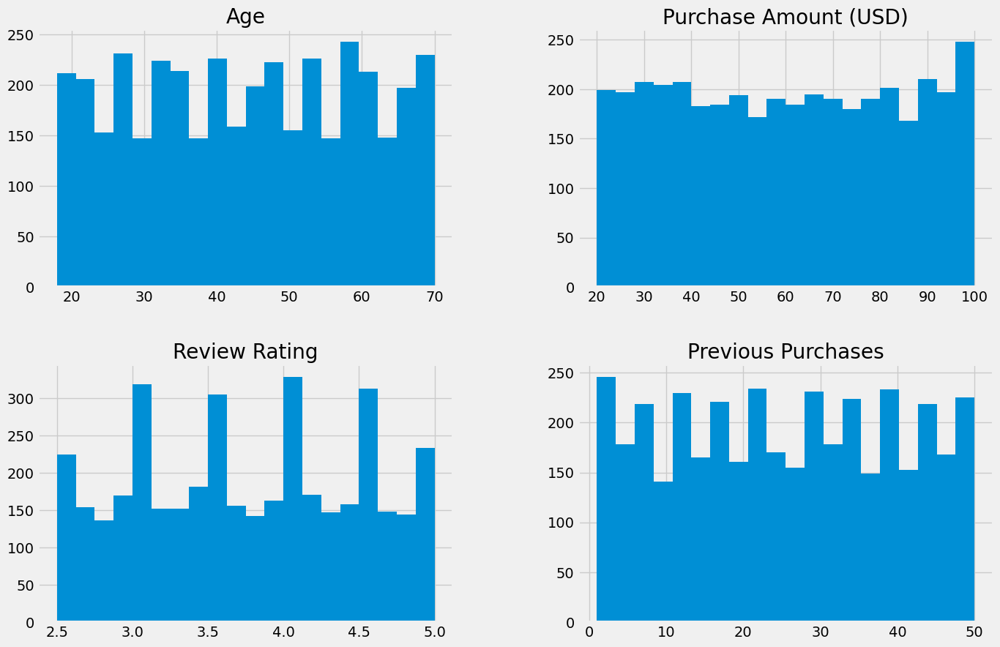

In [8]:
df.hist(figsize=(15, 10), bins=20)

<Axes: >

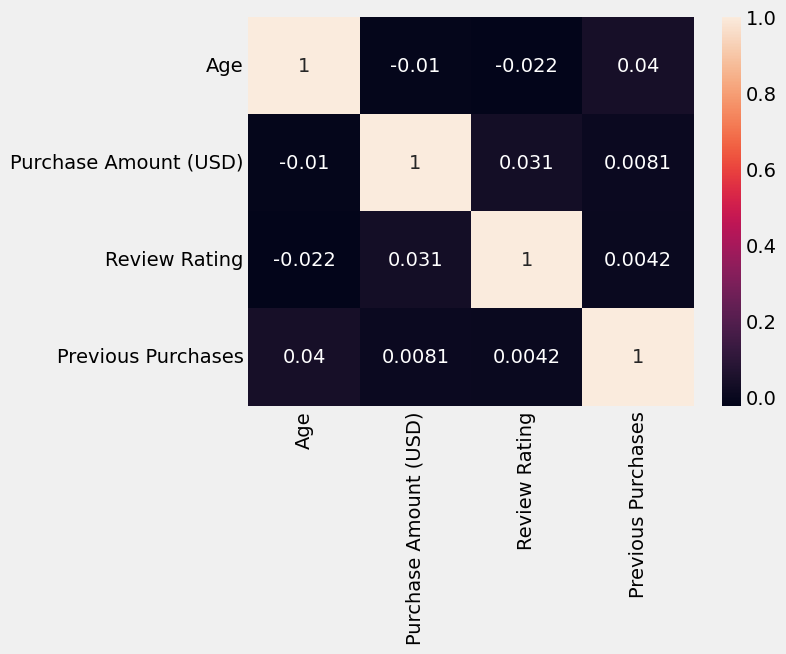

In [9]:
sns.heatmap(df.corr(numeric_only=True), annot=True)

Svi numerički atributi imaju nisku međusobnu korelaciju.

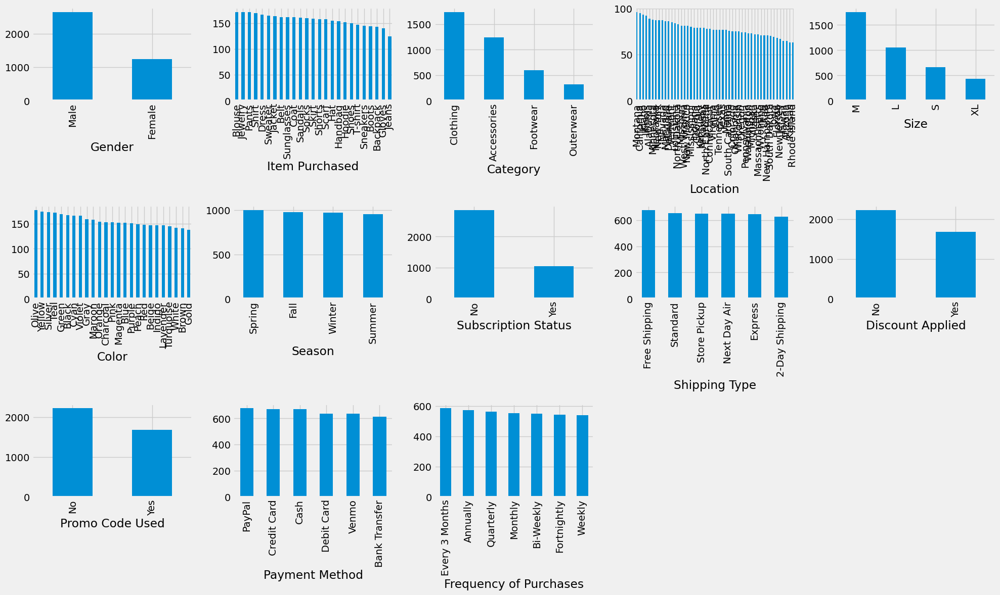

In [10]:
categorical = df.select_dtypes(include=["object"]).columns
fig, ax = plt.subplots(3, 5)
ax = ax.flatten()

for i, column in enumerate(categorical):
    df[column].value_counts().plot(kind="bar", ax=ax[i], figsize=(20, 12))

fig.delaxes(ax[-1])
fig.delaxes(ax[-2])
fig.tight_layout()

In [11]:
def freq_purchases_group(freq):
    if freq == "Every 3 Months":
        return "Quarterly"
    if freq == "Bi-Weekly":
        return "Weekly"
    if freq == "Fortnightly":
        return "Monthly"
    return freq

df["Frequency of Purchases"] = df["Frequency of Purchases"].apply(freq_purchases_group)

<Axes: xlabel='Frequency of Purchases'>

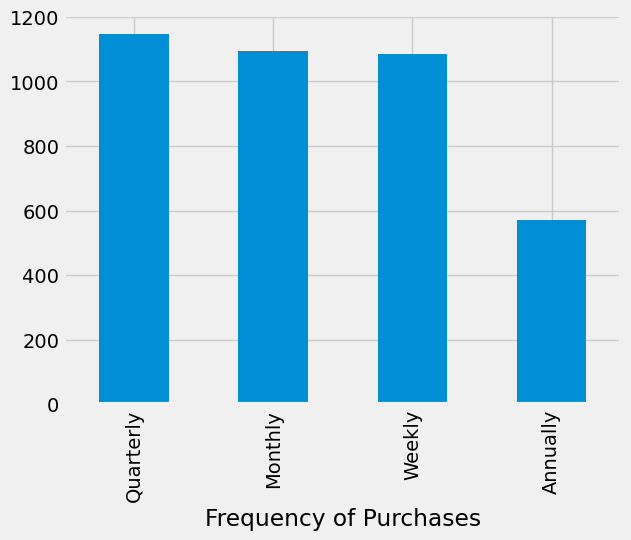

In [12]:
df["Frequency of Purchases"].value_counts().plot(kind="bar")

In [13]:
def payment_method_group(method):
    if method=="Venmo":
        return "PayPal"
    return method

df["Payment Method"] = df["Payment Method"].apply(payment_method_group)

<Axes: xlabel='Payment Method'>

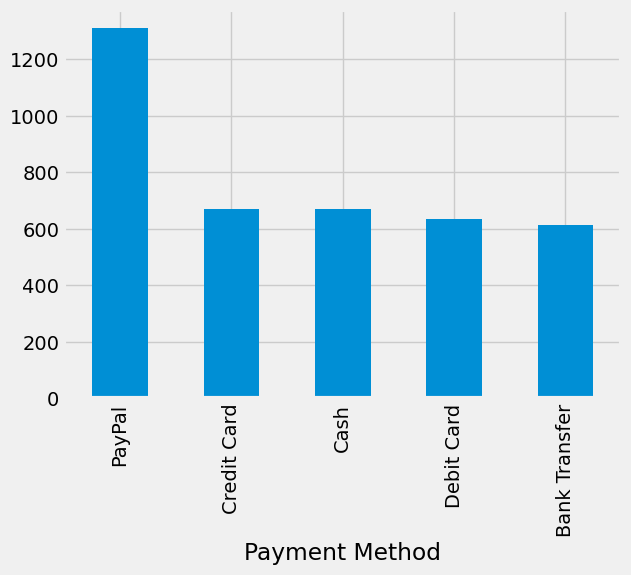

In [14]:
df["Payment Method"].value_counts().plot(kind="bar")

In [15]:
def shipping_type_group(type):
    if type == "Next Day Air" or type=="2-Day Shipping":
        return "Express"
    return type

#df["Shipping Type"] = df["Shipping Type"].apply(shipping_type_group)

<Axes: xlabel='Shipping Type'>

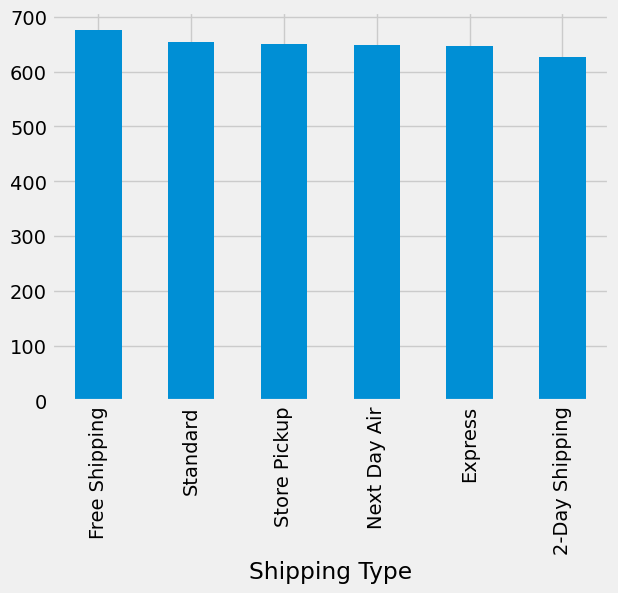

In [16]:
df["Shipping Type"].value_counts().plot(kind="bar")

In [17]:
df["Item Purchased"].nunique()

25

In [18]:
df["Location"].nunique()

50

In [19]:
df["Color"].nunique()

25

#### Grupišemo nominalne atribute u manji broj grupa kako bi smanjili njihovu kardinalnost.

##### Grupišemo boje

In [20]:
def color_mapper(color):
    if color in ["Blue", "Cyan", "Indigo", "Turquoise"]:
        return "Bluish"
    elif color in ["Olive", "Green", "Teal"]:
        return "Greenish"
    elif color in ["Red", "Maroon", "Magenta"]:
        return "Redish"
    elif color in ["Purple", "Violet", "Lavender", "Pink"]:
        return "Purplish"
    elif color in ["Gray", "Silver", "Charcoal"]:
        return "Grayish"
    elif color in ["Yellow", "Gold"]:
        return "Yellowish"
    elif color in ["Brown", "Beige"]:
        return "Brownish"
    elif color in ["Orange", "Peach"]:
        return "Orangish"
    else:
        return color


In [21]:
df["Grouped_Color"] = df["Color"].apply(color_mapper)

<Axes: xlabel='Grouped_Color'>

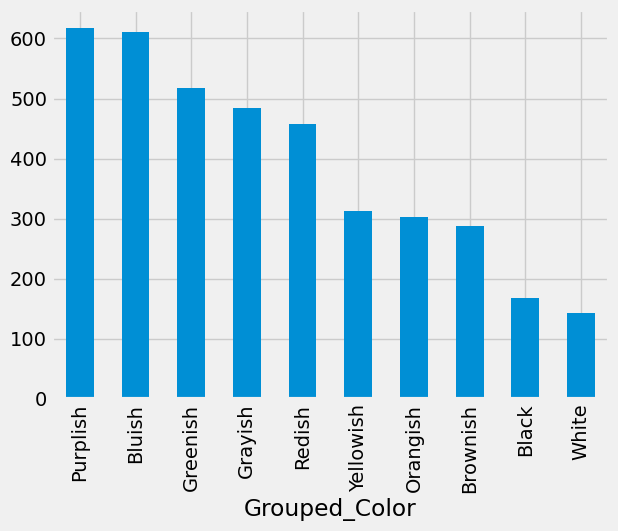

In [22]:
df["Grouped_Color"].value_counts().plot(kind="bar")

##### Grupišemo države na dva načina

Prvo po geografskoj lokaciji.

In [23]:
def geo_loc_mapper(state):
    if state in ["California", "Nevada", "Utah", "Colorado", "Wyoming", "Idaho", "Oregon", "Washington", "Montana", "Alaska", "Hawaii"]:
        return "West"
    elif state in ["Arizona", "New Mexico", "Texas", "Oklahoma"]:
        return "Southwest"
    elif state in ["North Dakota", "South Dakota", "Nebraska", "Kansas", "Minnesota", "Iowa", "Missouri", "Wisconsin", "Illinois", "Indiana", "Ohio", "Michigan"]:
        return "Midwest"
    elif state in ["Arkansas", "Louisiana", "Mississippi", "Alabama", "Georgia", "Florida", "South Carolina", "North Carolina", "Tennessee", "Kentucky", "West Virginia", "Virginia", "Washington", "Maryland", "Delaware"]:
        return "Southeast"
    else:
        return "Northeast"

In [24]:
df["region_Loc"] = df["Location"].apply(geo_loc_mapper)

<Axes: xlabel='region_Loc'>

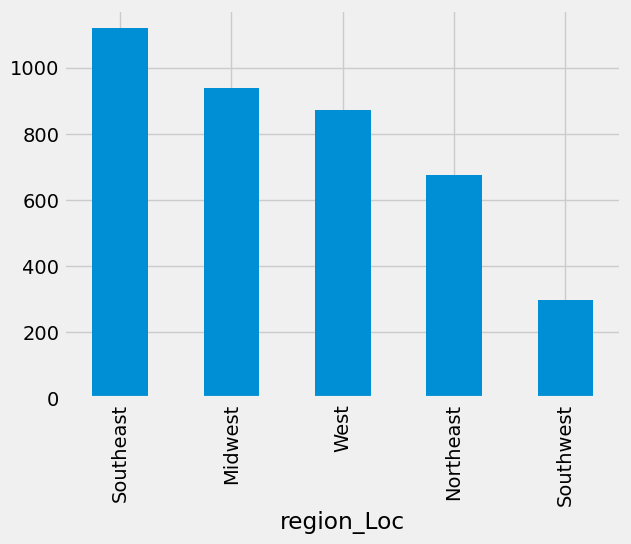

In [25]:
df["region_Loc"].value_counts().plot(kind="bar")

A zatim i po prihodu po glavi stanovnika.

In [26]:
pc_income_dict = {
    "Maryland": 90203,      "Utah": 79449,          "Pennsylvania": 68957,  "Wyoming": 65204,           "Tennessee": 59695,
    "Massachusetts": 89645, "Alaska": 77845,        "Wisconsin": 67125,     "Maine": 64767,             "South Carolina": 59318,
    "New Jersey": 89296,    "Minnesota": 77720,     "Texas": 66963,         "Kansas": 64124,            "Oklahoma": 55826,
    "New Hampshire": 88465, "New York": 74314,      "Nebraska": 66817,      "Michigan": 63498,          "Kentucky": 55573,
    "California": 84907,    "Rhode Island": 74008,  "Georgia": 66559,       "Montana": 63249,           "New Mexico": 53992,
    "Hawaii": 84857,        "Vermont": 72431,       "North Dakota": 66519,  "Florida": 63062,           "Alabama": 53913,
    "Washington": 84247,    "Illinois": 72205,      "Idaho": 66474,         "Indiana": 62743,           "Arkansas": 52528,
    "Connecticut": 83771,    "Oregon": 71562,       "Nevada": 66274,        "Ohio": 62262,              "Louisiana": 52087,
    "Colorado": 82254,      "Delaware": 71091,      "South Dakota": 66143,  "North Carolina": 61972,    "West Virginia": 51248,
    "Virginia": 80963,      "Arizona": 69056,       "Iowa": 65600,          "Missouri": 61847,          "Mississippi": 48716
}

In [27]:
pc_incomes = np.fromiter(pc_income_dict.values(), dtype=float)
income_percentiles = np.percentile(pc_incomes, [25, 50, 75])
income_percentiles

array([62382.25, 66539.  , 76868.5 ])

In [28]:
def make_income_mapper(income_percentiles):
    def income_mapper(state, income_percentiles=income_percentiles):
        state_income = pc_income_dict[state]
        if state_income <= income_percentiles[0]:
            return "low_income_state"
        elif state_income > income_percentiles[0] and state_income <= income_percentiles[1]:
            return "low_medium_income_state"
        elif state_income > income_percentiles[1] and state_income <= income_percentiles[2]:
            return "high_medium_income_state"
        else:
            return "high_income_state"
    return income_mapper

In [29]:
income_mapper = make_income_mapper(income_percentiles)
df["income_Loc"] = df["Location"].apply(income_mapper)

<Axes: xlabel='income_Loc'>

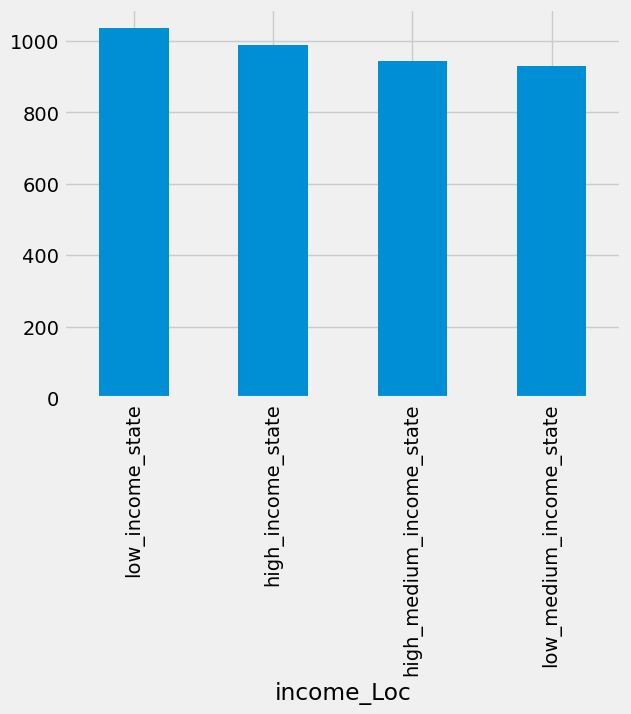

In [30]:
df["income_Loc"].value_counts().plot(kind="bar")

##### Proizvodi su već grupisani po kategorijama

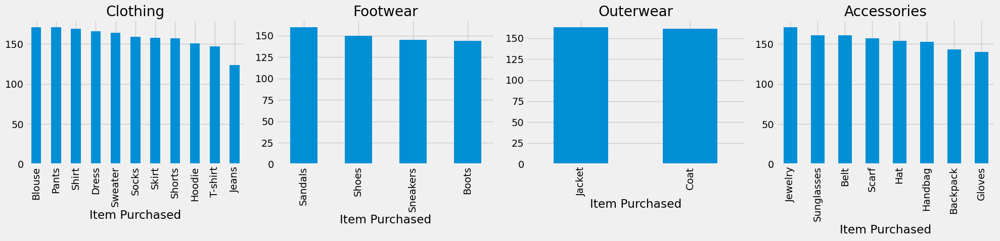

In [31]:
item_categories = df["Category"].unique()
fig, ax = plt.subplots(1, len(item_categories), figsize=(20, 5))

for i, category in enumerate(item_categories):
    ax[i].set_title(category)
    df[df["Category"] == category]["Item Purchased"].value_counts().plot(kind="bar", ax=ax[i])

fig.tight_layout()

Probaćemo klasterizaciju prvo sa sirovim (negrupisanim) atributima, a zatim ćemo probati i grupisane.

#### Detekcija outlier-a

<Axes: >

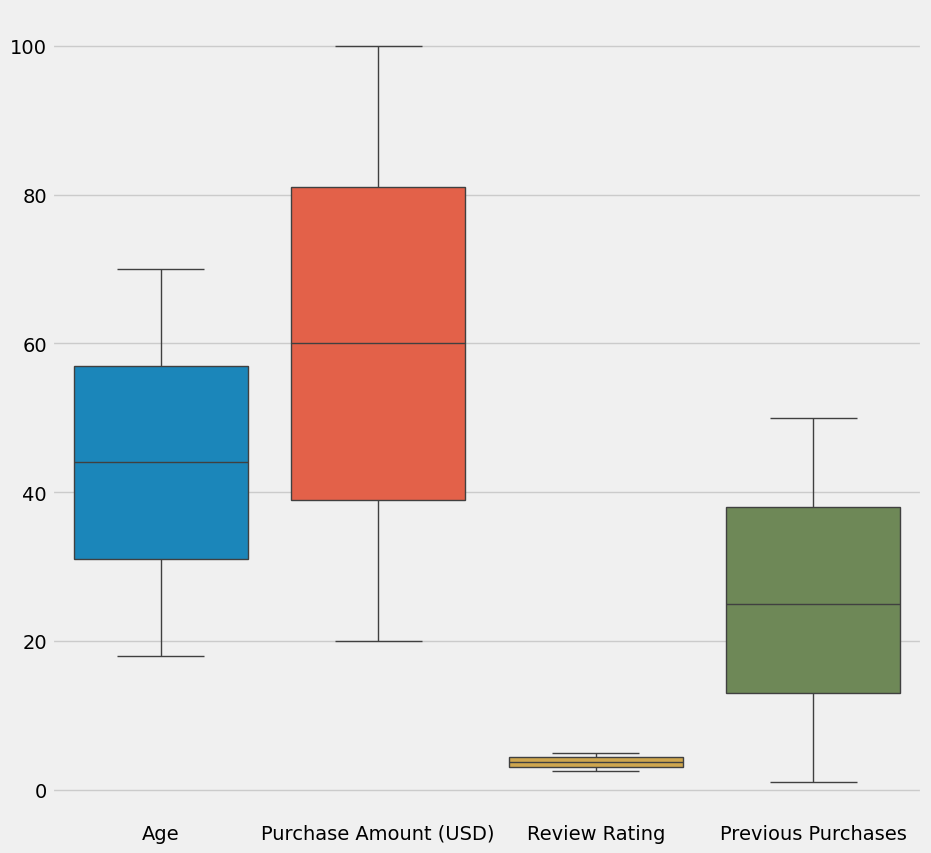

In [32]:
fig, ax = plt.subplots(1, figsize=(10, 10))
sns.boxplot(df, ax=ax)

Nemamo outliere.

## Pretprocesiranje

In [33]:
df.shape

(3900, 20)

In [34]:
onehot_pipe = make_pipeline(OneHotEncoder(sparse_output=False, drop="if_binary"))
binary_pipe = make_pipeline(BinaryEncoder())
minmax_scaler = make_pipeline(MinMaxScaler())
ordinal_enc = make_pipeline(OrdinalEncoder())

low_cardinality_columns = ["Gender", "Category", "Season", "Subscription Status", "Shipping Type", "Discount Applied", "Promo Code Used", "Payment Method", "Frequency of Purchases", "income_Loc", "region_Loc"]
high_cardinality_columns = ["Item Purchased", "Location", "Color", "Grouped_Color"]

In [35]:
def make_transformer(dataset, low_c_cols, high_c_cols, minimize_n_feat=True):
    high_intersection = list(set(dataset.columns) & set(high_c_cols))
    low_intersection = list(set(dataset.columns) & set(low_c_cols))

    high_c_transformer = binary_pipe if minimize_n_feat else onehot_pipe

    return ColumnTransformer([("high_cardinality_categorical_transform", high_c_transformer, high_intersection),
                              ("low_cardinality_categorical_transform", onehot_pipe, low_intersection),
                              ("ordinal_transformer", ordinal_enc, make_column_selector(pattern="Size")),
                              ("num_transformer", minmax_scaler, make_column_selector(dtype_exclude="object"))],
                                remainder="passthrough",
                                verbose_feature_names_out=False) \
                              .set_output(transform="pandas")

In [36]:
dataset_raw = df.drop(["Grouped_Color", "region_Loc", "income_Loc"], axis=1)

In [37]:
dataset_grouped = df.drop(["Color", "Location", "Item Purchased", "region_Loc"], axis=1)

In [38]:
dataset_raw.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.100,Yes,Express,Yes,Yes,14,PayPal,Monthly
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.100,Yes,Express,Yes,Yes,2,Cash,Monthly
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.100,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.500,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.700,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually


In [39]:
dataset_grouped.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Grouped_Color,income_Loc
0,55,Male,Clothing,53,L,Winter,3.100,Yes,Express,Yes,Yes,14,PayPal,Monthly,Grayish,low_income_state
1,19,Male,Clothing,64,L,Winter,3.100,Yes,Express,Yes,Yes,2,Cash,Monthly,Redish,low_medium_income_state
2,50,Male,Clothing,73,S,Spring,3.100,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,Redish,high_income_state
3,21,Male,Footwear,90,M,Spring,3.500,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,Redish,high_medium_income_state
4,45,Male,Clothing,49,M,Spring,2.700,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Bluish,high_medium_income_state


In [40]:
transformer_v1 = make_transformer(dataset_raw, low_cardinality_columns, high_cardinality_columns)

In [41]:
dataset_raw_t = transformer_v1.fit_transform(dataset_raw)

In [42]:
pd.DataFrame(dataset_raw_t, columns=transformer_v1.get_feature_names_out()).head()

,Item Purchased_0,Item Purchased_1,Item Purchased_2,Item Purchased_3,Item Purchased_4,Location_0,Location_1,Location_2,Location_3,Location_4,Location_5,Color_0,Color_1,Color_2,Color_3,Color_4,Gender_Male,Shipping Type_2-Day Shipping,Shipping Type_Express,Shipping Type_Free Shipping,Shipping Type_Next Day Air,Shipping Type_Standard,Shipping Type_Store Pickup,Subscription Status_Yes,Payment Method_Bank Transfer,Payment Method_Cash,Payment Method_Credit Card,Payment Method_Debit Card,Payment Method_PayPal,Promo Code Used_Yes,Discount Applied_Yes,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Frequency of Purchases_Annually,Frequency of Purchases_Monthly,Frequency of Purchases_Quarterly,Frequency of Purchases_Weekly,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Size,Age,Purchase Amount (USD),Review Rating,Previous Purchases
0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.712,0.413,0.240,0.265
1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.019,0.550,0.240,0.020
2,0,0,0,1,1,0,0,0,0,1,1,0,0,0,1,0,1.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,2.000,0.615,0.663,0.240,0.449
3,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.058,0.875,0.400,0.980
4,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,1,1.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.519,0.363,0.080,0.612


<Axes: >

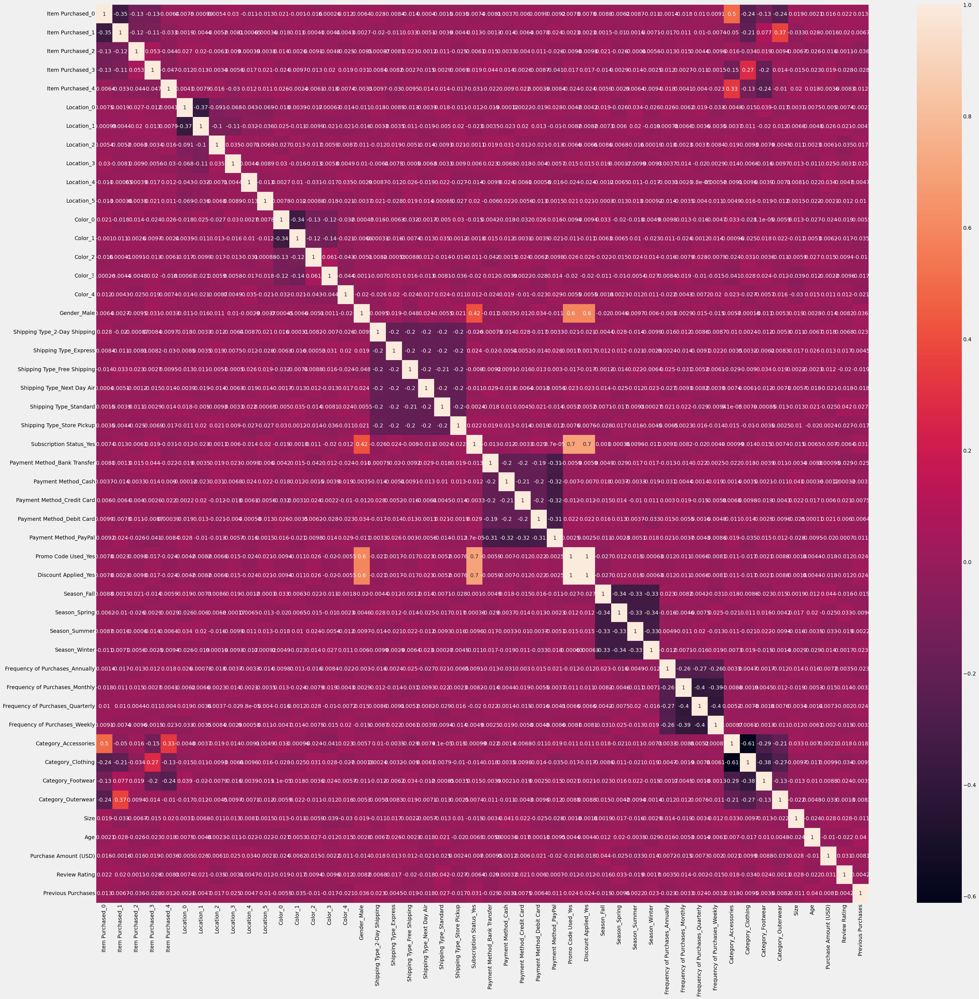

In [43]:
fig, ax = plt.subplots(1, figsize=(40, 40))
sns.heatmap(pd.DataFrame(dataset_raw_t, columns=transformer_v1.get_feature_names_out()).corr(numeric_only=False), annot=True, ax=ax)

<Axes: >

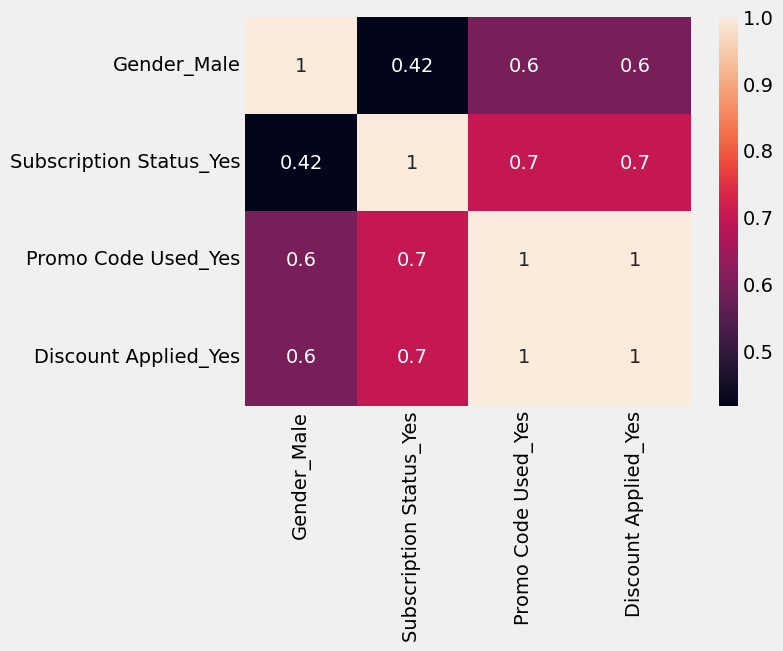

In [44]:
sns.heatmap(pd.DataFrame(dataset_raw_t, columns=transformer_v1.get_feature_names_out()).filter(regex="Discount|Promo|Subscription|Gender").corr(numeric_only=False), annot=True)

In [45]:
dataset_raw[dataset_raw["Promo Code Used"] != dataset_raw["Discount Applied"]].head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases


Zahvaljujući ovim rezultatima brišemo kolonu ***"Promo Code Used"***

In [46]:
if "Promo Code Used" in dataset_raw.columns:
    dataset_raw.drop("Promo Code Used", axis=1, inplace=True)

if "Promo Code Used" in dataset_grouped.columns:
    dataset_grouped.drop("Promo Code Used", axis=1, inplace=True)

## Klasterizacija

In [47]:
raw_transformer = make_transformer(dataset_raw, low_cardinality_columns, high_cardinality_columns)

dataset_raw_t = raw_transformer.fit_transform(dataset_raw)

In [48]:
grouped_transformer = make_transformer(dataset_grouped, low_cardinality_columns, high_cardinality_columns, minimize_n_feat=False)

dataset_grouped_t = grouped_transformer.fit_transform(dataset_grouped)

### Pomoćne funkcije

In [49]:
def run_kmeans(dataset, n_c):
    objective_fs = []
    silhouette_scores = []

    for k in n_c:
        kmeans = KMeans(n_clusters=k, n_init=10, max_iter=500)
        kmeans.fit(dataset)
        objective_fs.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(dataset, kmeans.predict(dataset)))
    
    return objective_fs, silhouette_scores

In [50]:
def run_kmedoids(dataset, n_c, dist_metric="euclidean"):
    objective_fs = []
    silhouette_scores = []

    for k in n_c:
        kmed = KMedoids(n_clusters=k, metric=dist_metric, init="k-medoids++", max_iter=500, method="pam")
        kmed.fit(dataset)
        objective_fs.append(kmed.inertia_)
        silhouette_scores.append(silhouette_score(dataset, kmed.predict(dataset), metric=dist_metric))
    
    return objective_fs, silhouette_scores

In [51]:
n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

In [52]:
def plot_results(objective_fs, silhouette_scores, n_c, ax):
    ax[0].plot(n_c, objective_fs, label="Distances function")
    ax[1].plot(n_c, silhouette_scores, label="Silhouette score")
    ax[0].legend()
    ax[1].legend()
    

In [53]:
def plot_clusters(data, labels, ax, plot_tsne=True, tsne_metric="euclidean"):

    ax[0].set_title("PCA 2D")
    pca2d = PCA(n_components=2, svd_solver="full")
    pca_components2d = pca2d.fit_transform(data)
    print(f"2d PCA - explained variances: {pca2d.explained_variance_ratio_}")
    ax[0].scatter(pca_components2d[:, 0], pca_components2d[:, 1], c=labels)

    ax[1].set_title("PCA 3D")
    pca3d = PCA(n_components=3, svd_solver="full")
    pca_components3d = pca3d.fit_transform(data)
    print(f"3d PCA - explained variances: {pca3d.explained_variance_ratio_}")
    ax[1].scatter(pca_components3d[:, 0], pca_components3d[:, 1], pca_components3d[:, 2], c=labels)

    if plot_tsne:
        ax[2].set_title("TSNE 2D")
        tsne2d = TSNE(n_components=2, perplexity=30., metric=tsne_metric, early_exaggeration=24., n_jobs=-1)
        tsne_components2d = tsne2d.fit_transform(data)
        ax[2].scatter(tsne_components2d[:, 0], tsne_components2d[:, 1], c=labels)

        ax[3].set_title("TSNE 3D")
        tsne3d = TSNE(n_components=3, perplexity=30., metric=tsne_metric, early_exaggeration=24., n_jobs=-1)
        tsne_components3d = tsne3d.fit_transform(data)
        ax[3].scatter(tsne_components3d[:, 0], tsne_components3d[:, 1], tsne_components3d[:, 2],c=labels)

In [54]:
def run_dbscan(dataset, eps_vals, min_samples, metric="euclidean", metric_params=None):
    silhouette_scores = []

    for eps in eps_vals:
        for min_sample in min_samples:
            dbscan = DBSCAN(eps=eps, min_samples=min_sample, metric=metric, metric_params=metric_params, n_jobs=-1)
            labels = dbscan.fit_predict(dataset)
            if(len(set(labels))) > 1:
                silhouette_scores.append((silhouette_score(dataset, labels), eps, min_sample))
            else:
                silhouette_scores.append((-1, eps, min_sample))
    return silhouette_scores

In [55]:
def get_feature_importances(dataset, labels):
    rf = RandomForestClassifier(random_state=42, n_jobs=-1).fit(dataset, labels)
    f_importances_rf = sorted(list(zip(rf.feature_importances_, rf.feature_names_in_)), key=lambda x: x[0], reverse=True)

    lasso = LogisticRegression(solver="liblinear", C=20, penalty="l1").fit(dataset, labels)
    f_importances_lasso = sorted(list(zip(lasso.coef_.reshape((-1,)), lasso.feature_names_in_)), key=lambda x: x[0], reverse=True)

    return f_importances_rf, f_importances_lasso

### KMeans sa "raw" podacima

In [365]:
obj_fs, s_scores = run_kmeans(dataset_raw_t, n_clusters)

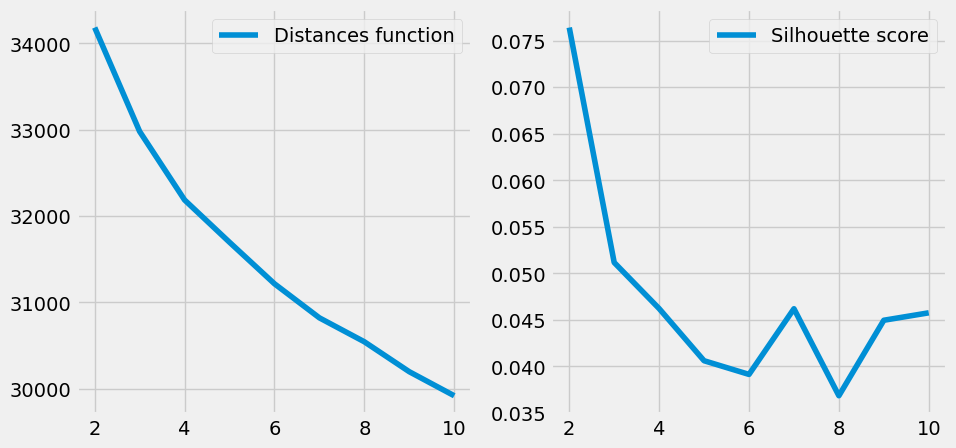

In [366]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_results(obj_fs, s_scores, n_clusters, ax)

In [367]:
best_kmeans = KMeans(n_clusters=2, n_init=10, max_iter=500)

best_kmeans.fit(dataset_raw_t)
cluster_labels = best_kmeans.predict(dataset_raw_t)

2d PCA - explained variances: [0.09257191 0.05263474]
3d PCA - explained variances: [0.09257191 0.05263474 0.05103283]


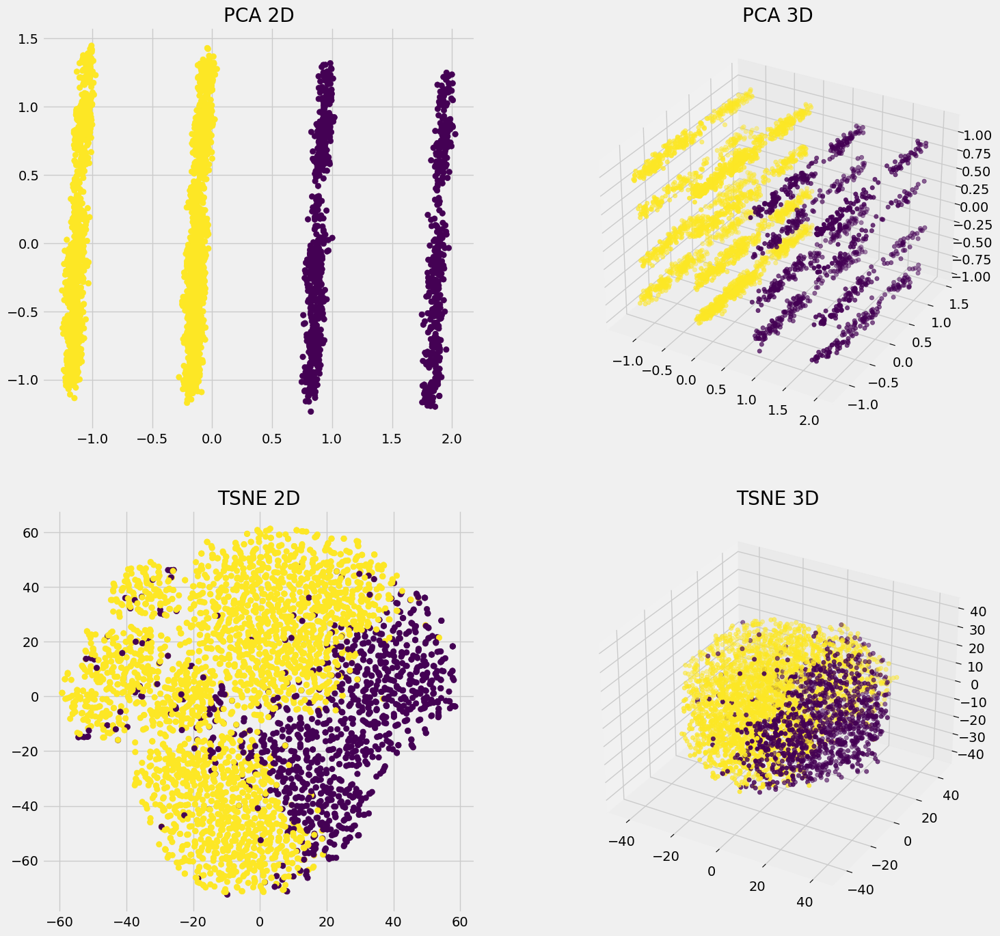

In [368]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_raw_t, cluster_labels, ax=(ax1, ax2, ax3, ax4))

### KMeans sa grupisanim kategorickim atributima

In [369]:
obj_fs, s_scores = run_kmeans(dataset_grouped_t, n_clusters)

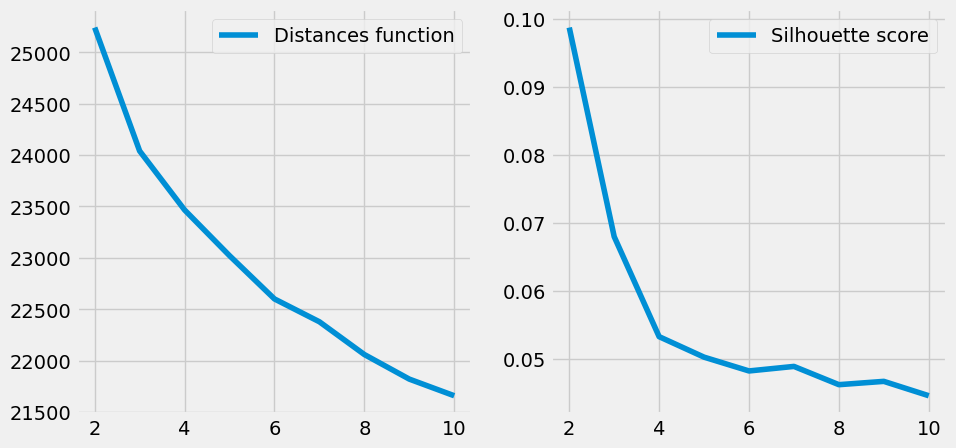

In [370]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_results(obj_fs, s_scores, n_clusters, ax)

In [371]:
best_kmeans = KMeans(n_clusters=2, n_init=10, max_iter=500)

best_kmeans.fit(dataset_grouped_t)
cluster_labels = best_kmeans.predict(dataset_grouped_t)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


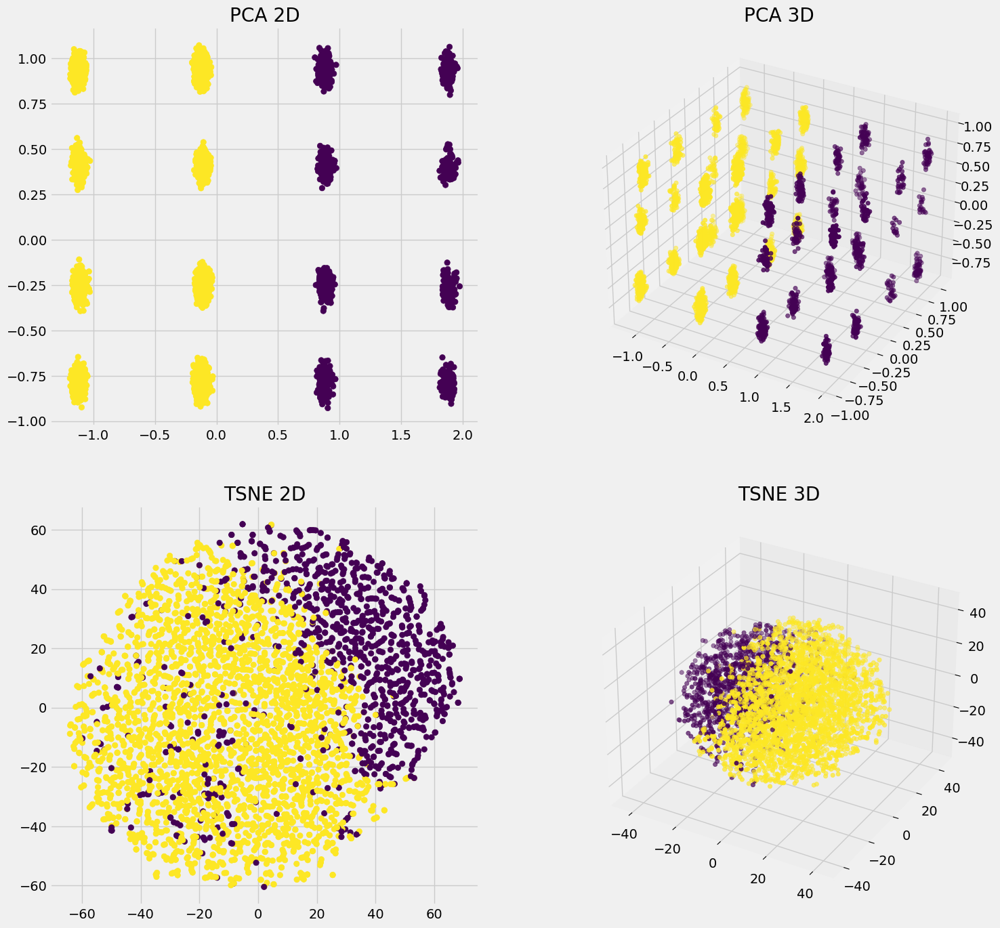

In [372]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_grouped_t, cluster_labels, ax=(ax1, ax2, ax3, ax4))

In [373]:
f_importances_rf, f_imporatnces_lasso = get_feature_importances(dataset_grouped_t, cluster_labels)

<BarContainer object of 43 artists>

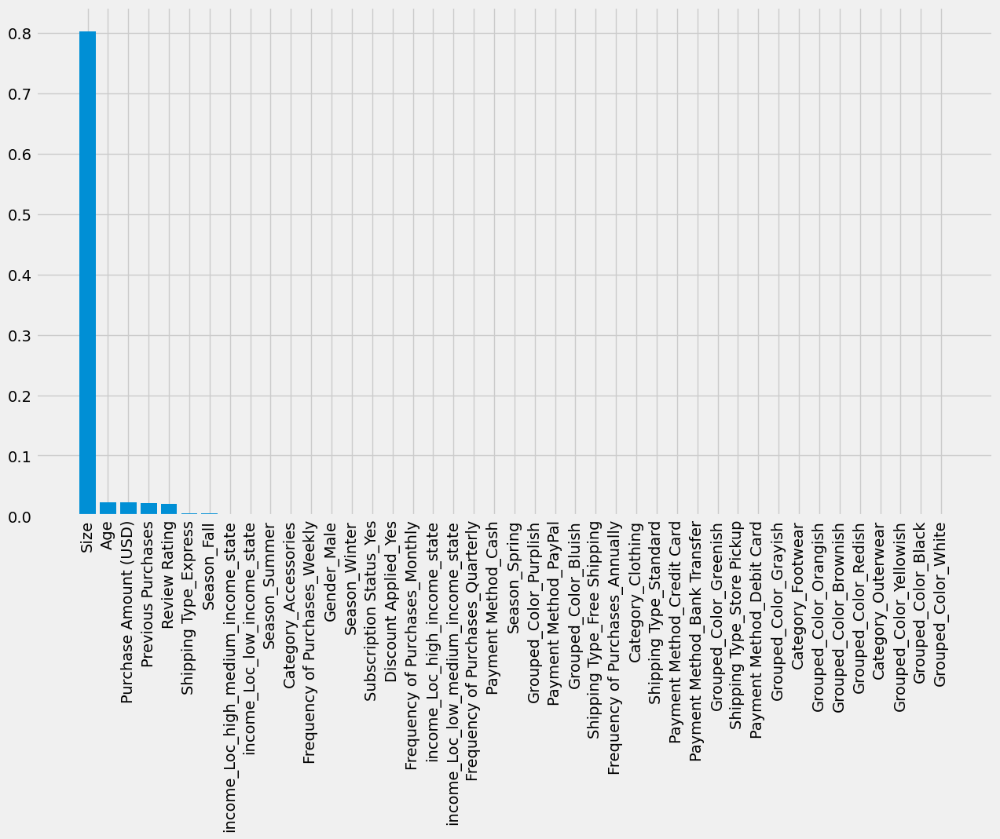

In [374]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_importances_rf)), height=list(map(lambda x: x[0], f_importances_rf)))

<BarContainer object of 43 artists>

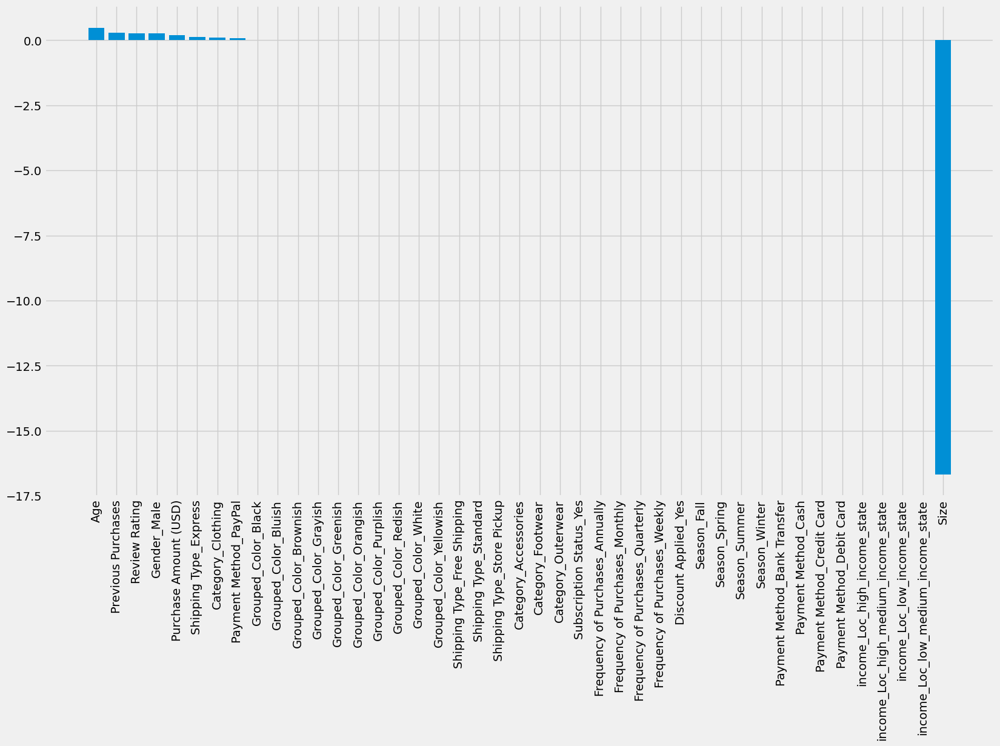

In [375]:
fig, ax = plt.subplots(1, figsize=(18, 10))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imporatnces_lasso)), height=list(map(lambda x: x[0], f_imporatnces_lasso)))

### KMedoids korišćenjem raziličitih metrika za udaljenost

#### Euclidean

In [376]:
obj_fs, s_scores = run_kmedoids(dataset_grouped_t, n_clusters)

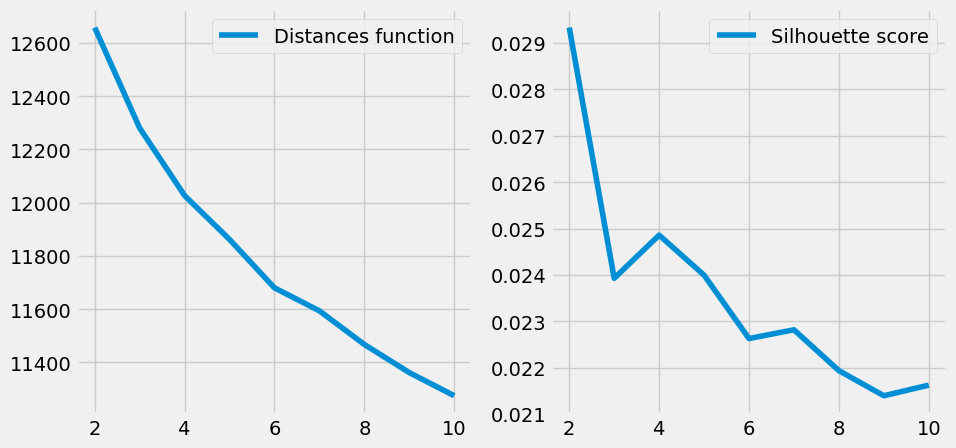

In [377]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_results(obj_fs, s_scores, n_clusters, ax)

In [378]:
best_kmeds = KMedoids(n_clusters=4, metric="euclidean", init="k-medoids++", max_iter=500)

best_kmeds.fit(dataset_grouped_t)
cluster_labels = best_kmeds.predict(dataset_grouped_t)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


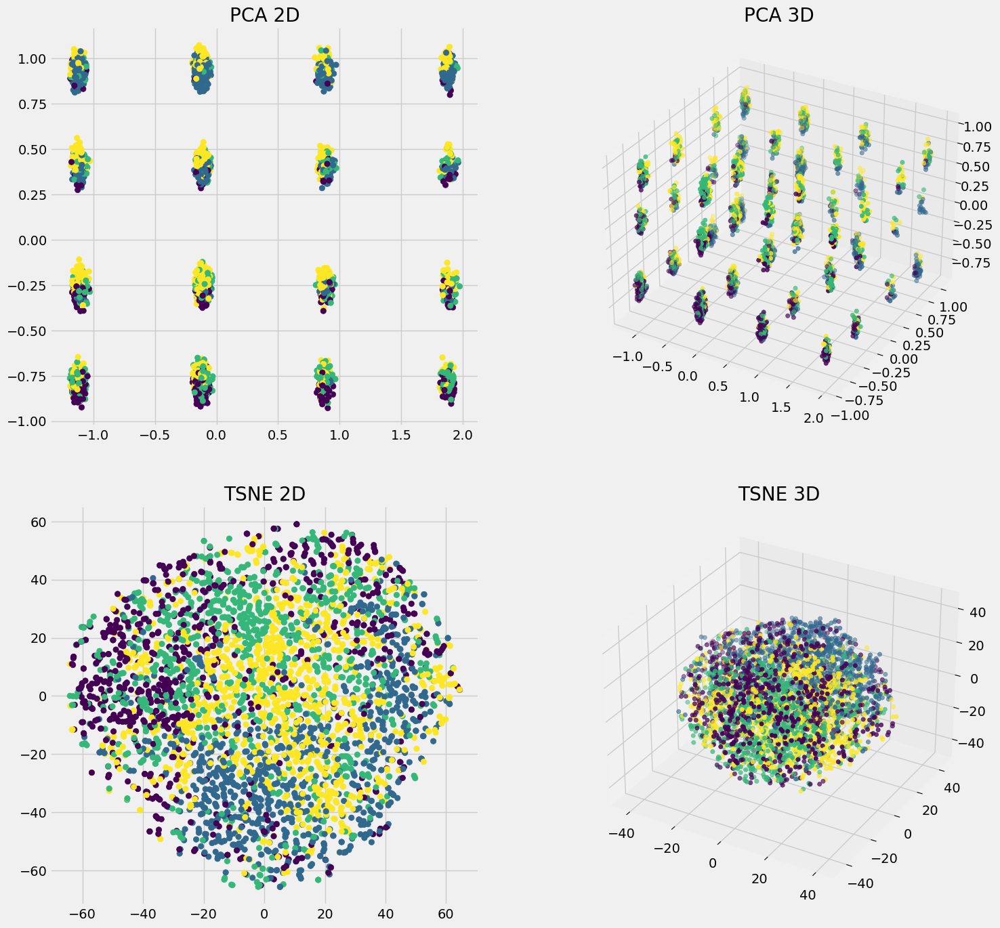

In [379]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plt.title("Euclidean distance - KMedoids")
plot_clusters(dataset_grouped_t, cluster_labels, ax=(ax1, ax2, ax3, ax4))

#### Hamming

In [380]:
obj_fs, s_scores = run_kmedoids(dataset_grouped_t, n_clusters, dist_metric="hamming")

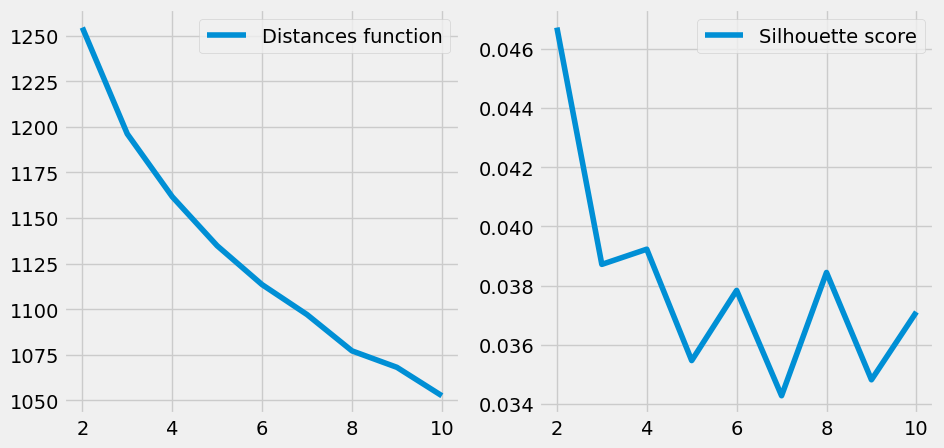

In [381]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_results(obj_fs, s_scores, n_clusters, ax)

In [382]:
best_kmeds = KMedoids(n_clusters=2, metric="hamming", init="k-medoids++", max_iter=500)

best_kmeds.fit(dataset_grouped_t)
cluster_labels = best_kmeds.predict(dataset_grouped_t)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


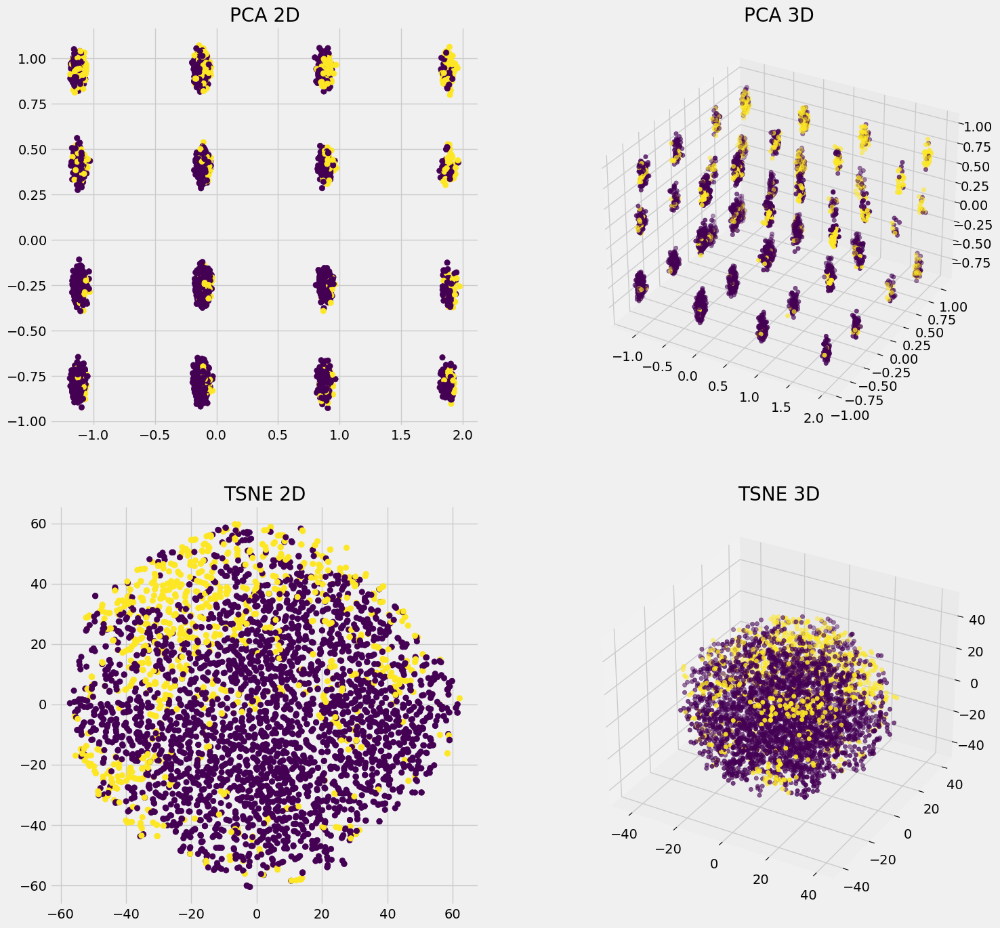

In [383]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_grouped_t, cluster_labels, ax=(ax1, ax2, ax3, ax4), tsne_metric="hamming")

#### Manhattan

In [384]:
obj_fs, s_scores = run_kmedoids(dataset_grouped_t, n_clusters, dist_metric="cityblock")

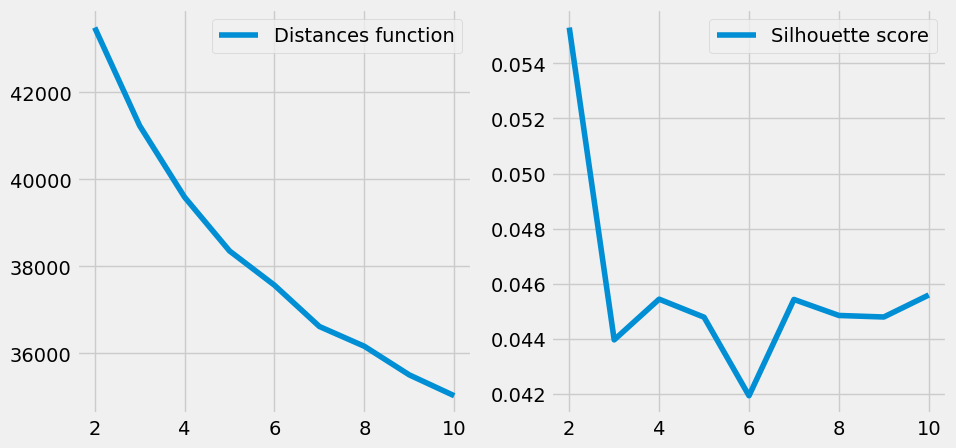

In [385]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_results(obj_fs, s_scores, n_clusters, ax)

In [386]:
best_kmeds = KMedoids(n_clusters=2, metric="cityblock", init="k-medoids++", max_iter=500)

best_kmeds.fit(dataset_grouped_t)
cluster_labels = best_kmeds.predict(dataset_grouped_t)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


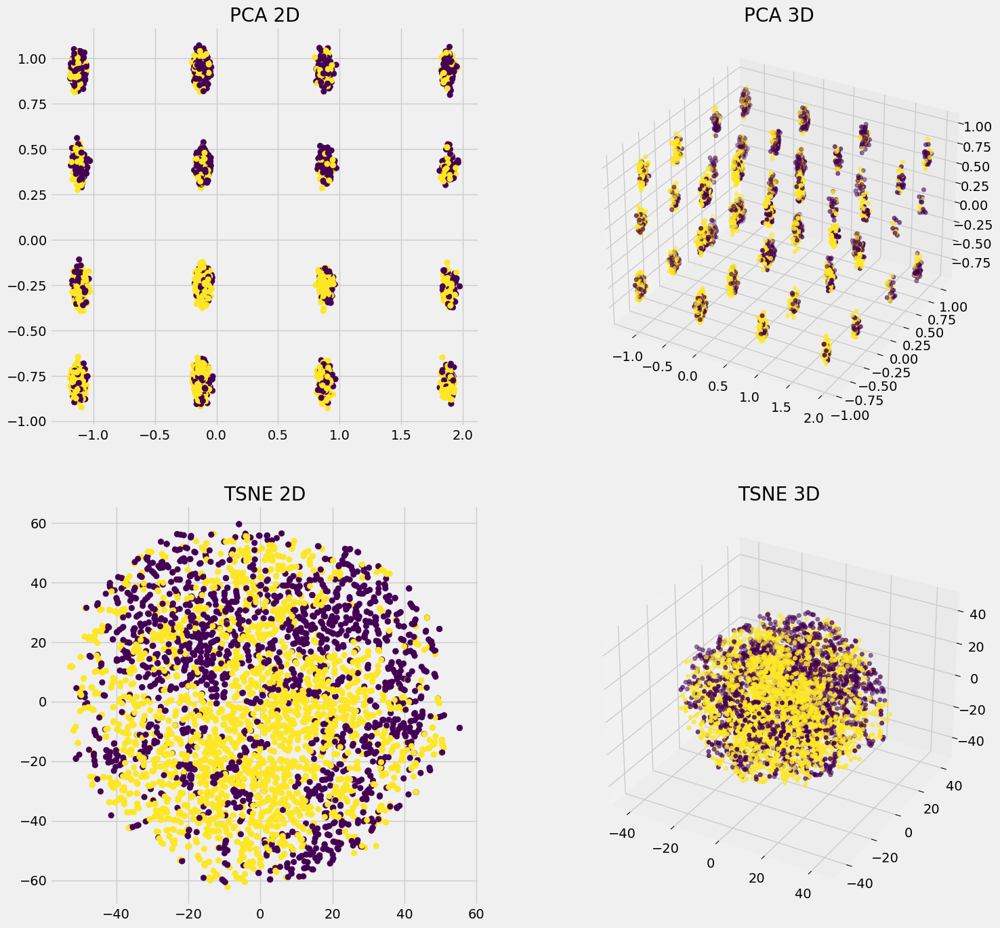

In [387]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_grouped_t, cluster_labels, ax=(ax1, ax2, ax3, ax4), tsne_metric="cityblock")

#### Gower

In [388]:
objfs = []
silscores = []

dist = gower.gower_matrix(dataset_grouped_t)

for n in n_clusters:
    kmed = KMedoids(n_clusters=n, method="pam", metric="precomputed", init="k-medoids++", max_iter=500)
    kmed.fit(dist)
    objfs.append(kmed.inertia_)
    silscores.append(silhouette_score(dist, kmed.predict(dist), metric="precomputed"))

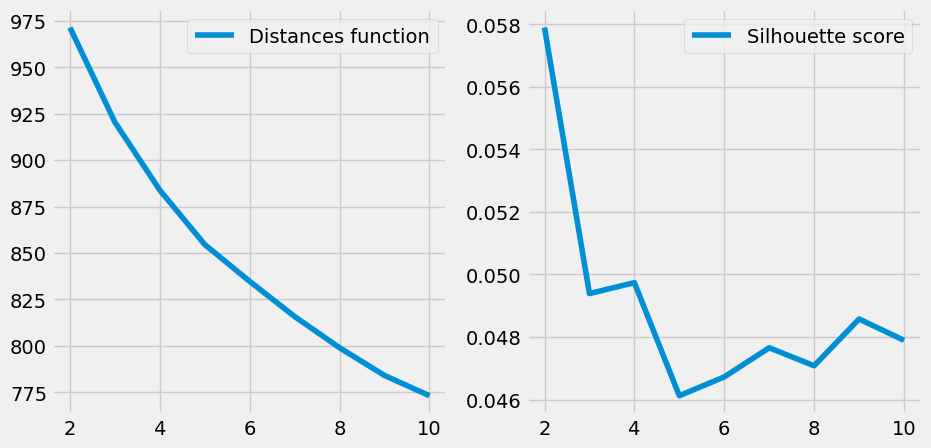

In [389]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_results(objfs, silscores, n_clusters, ax)

In [390]:
best_kmed = KMedoids(n_clusters=2, method="pam", metric="precomputed", init="k-medoids++", max_iter=500)

best_kmed.fit(dist)
c_labels = best_kmed.predict(dist)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


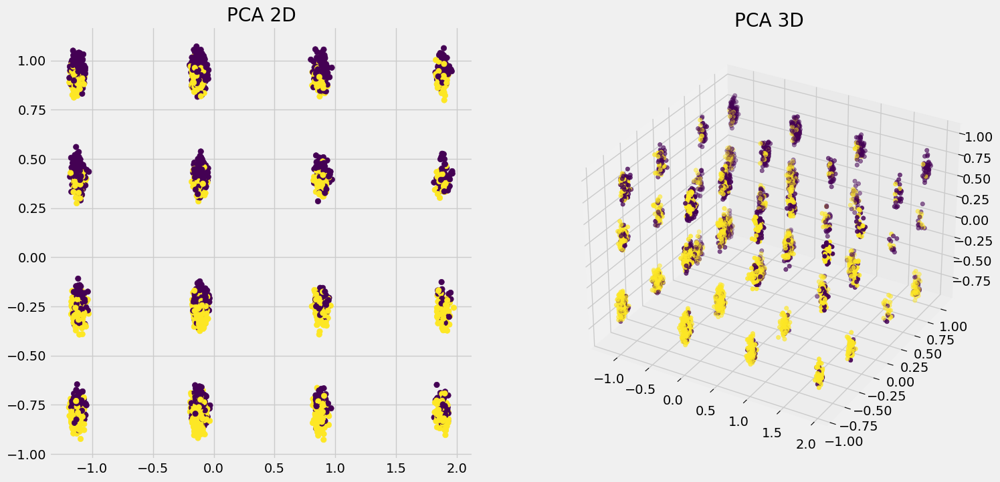

In [391]:
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

plot_clusters(dataset_grouped_t, c_labels, ax=(ax1, ax2), plot_tsne=False)

### K-Prototypes

In [392]:
categorical = dataset_grouped.select_dtypes(include="object")
categorical_i = []

for col in categorical:
    categorical_i.append(dataset_grouped.columns.get_loc(col))

objfs = []
for n in n_clusters:
    kprot = KPrototypes(n_clusters=n, max_iter=300, init="Cao", n_jobs=-1)
    kprot.fit(dataset_grouped, categorical=categorical_i)
    objfs.append(kprot.cost_)


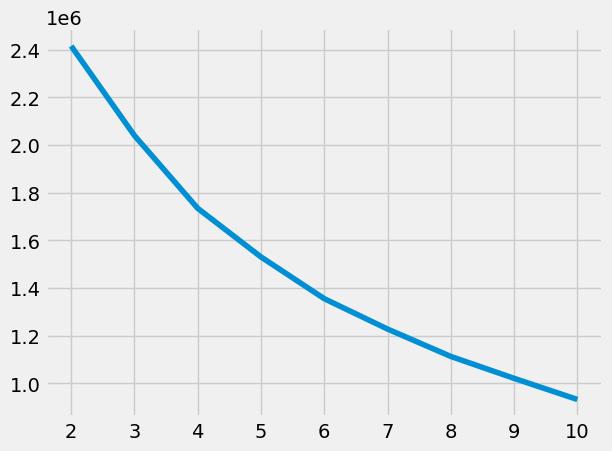

In [393]:
plt.plot(n_clusters, objfs)

In [394]:
best_kprot = KPrototypes(n_clusters=2, max_iter=300, init="Cao", n_jobs=-1)

cluster_labels = best_kprot.fit_predict(dataset_grouped, categorical=categorical_i)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


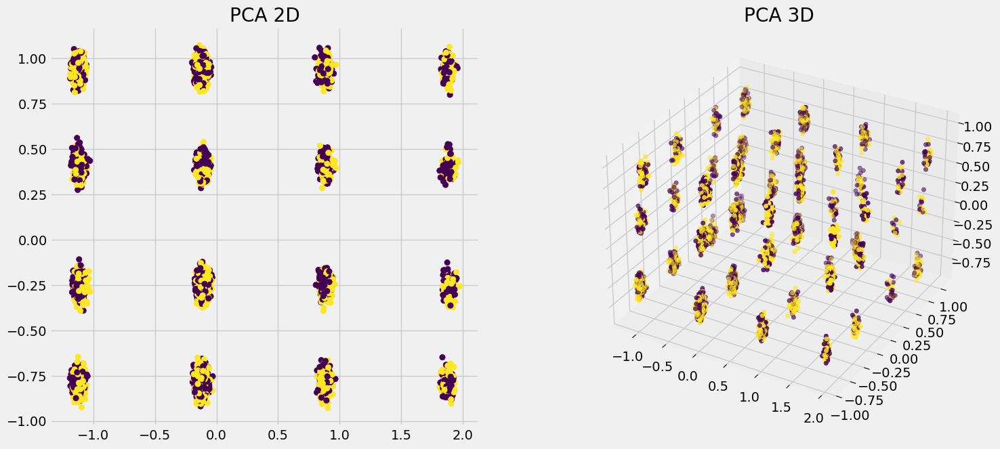

In [395]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')

plot_clusters(dataset_grouped_t, cluster_labels, ax=(ax1, ax2), plot_tsne=False)

### AglomerativeHierarchical

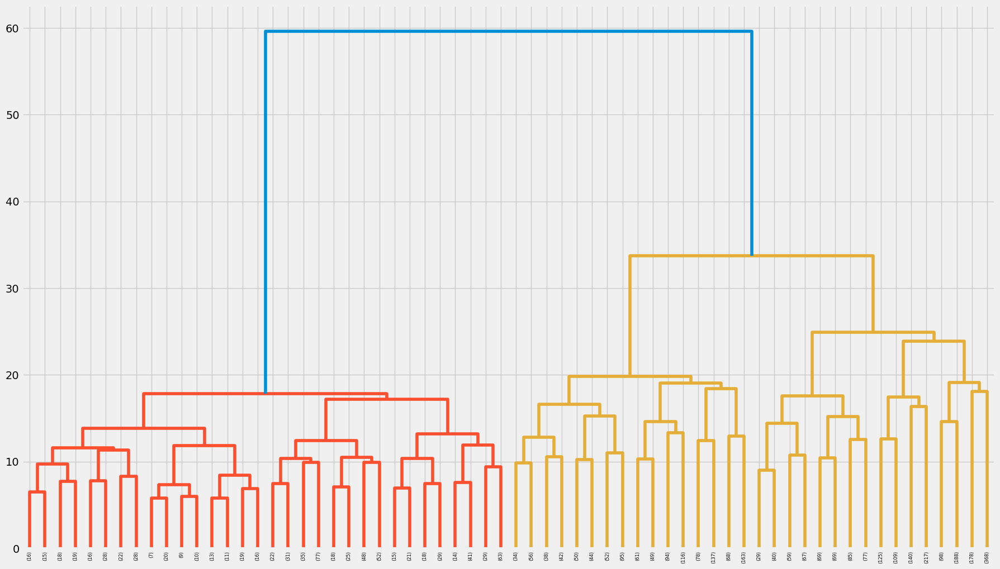

In [396]:
z = linkage(dataset_grouped_t, metric="euclidean", method="ward")

fig = plt.figure(figsize=(20, 12))
dn = dendrogram(z, truncate_mode="level", p=5)
plt.show()

In [397]:
model = AgglomerativeClustering(n_clusters=2)

cluster_labels = model.fit_predict(dataset_grouped_t)

2d PCA - explained variances: [0.12220795 0.06742678]
3d PCA - explained variances: [0.12220795 0.06742678 0.05325727]


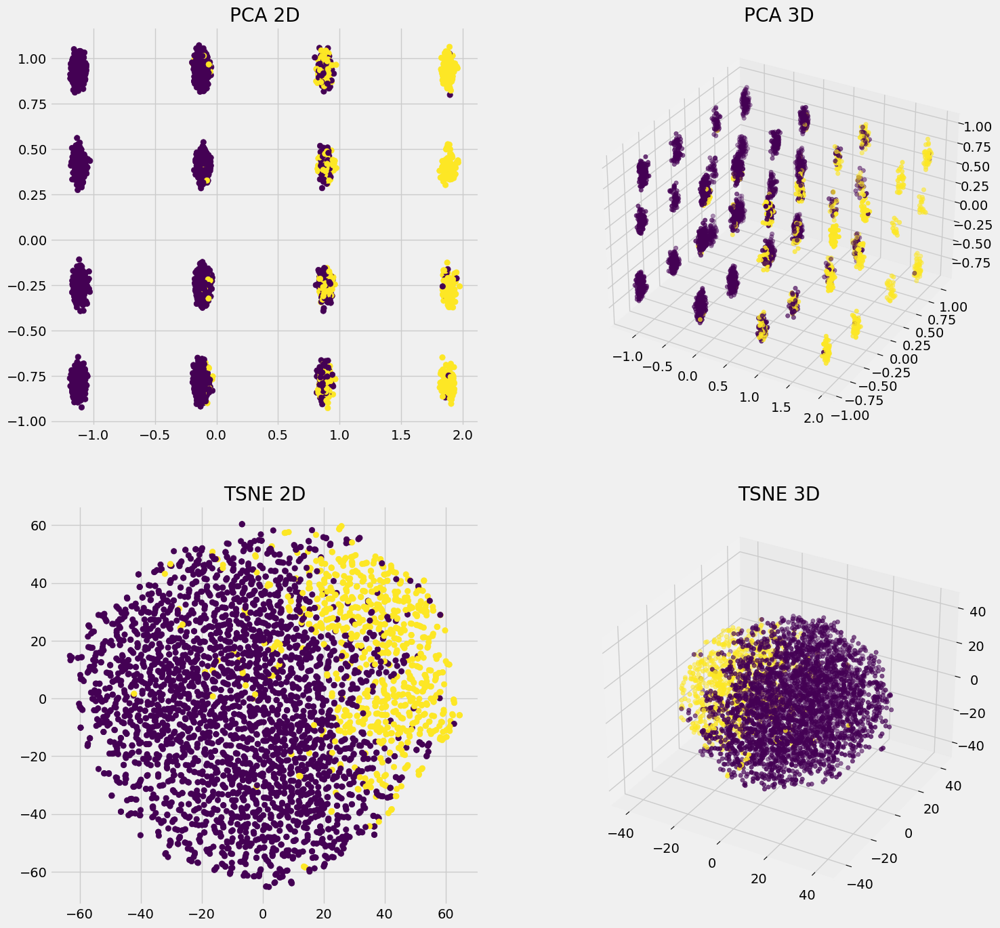

In [398]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_grouped_t, cluster_labels, ax=(ax1, ax2, ax3, ax4))

In [399]:
f_importances_rf, f_importances_lasso = get_feature_importances(dataset_grouped_t, cluster_labels)

<BarContainer object of 43 artists>

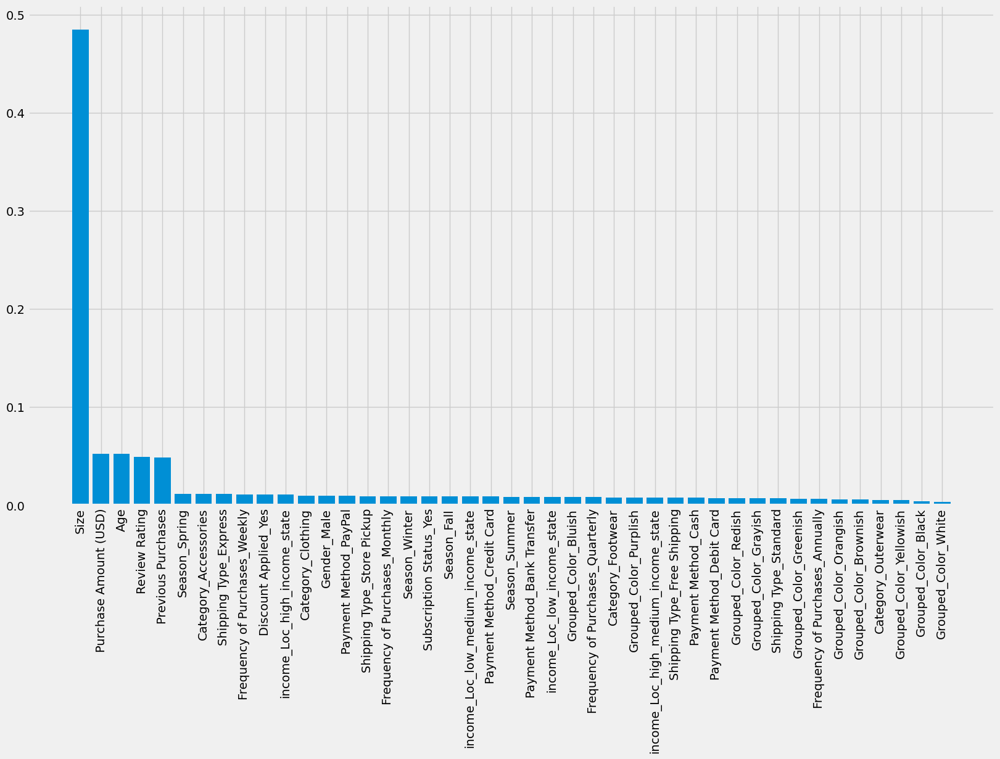

In [400]:
fig, ax = plt.subplots(1, figsize=(18, 10))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_importances_rf)), height=list(map(lambda x: x[0], f_importances_rf)))

<BarContainer object of 43 artists>

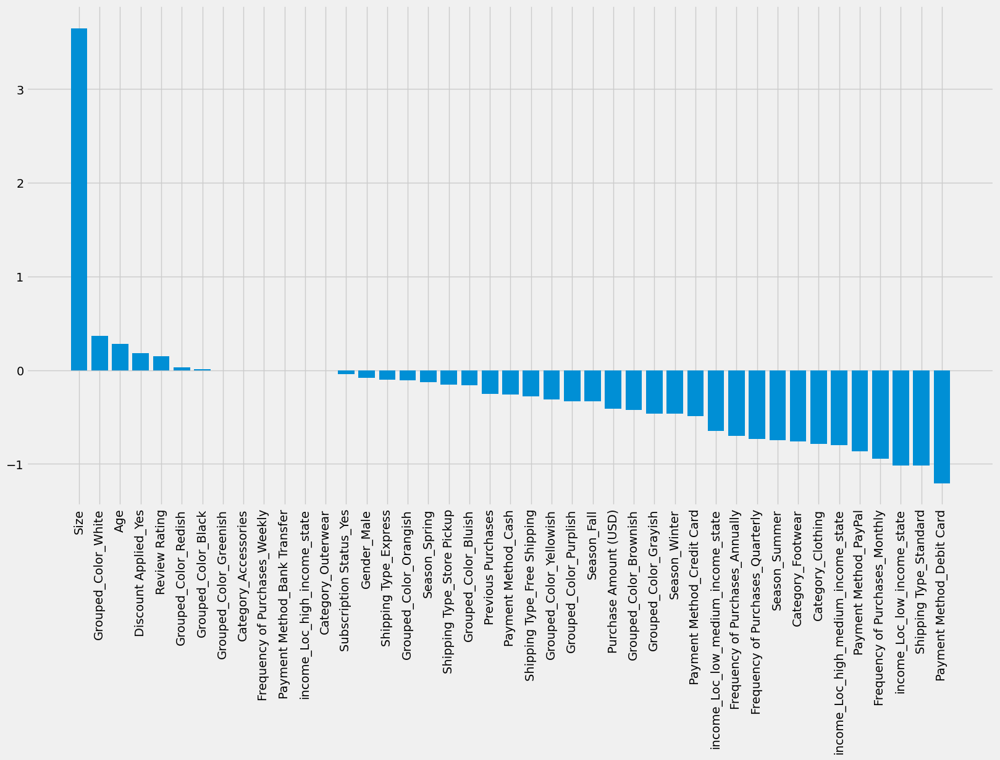

In [401]:
fig, ax = plt.subplots(1, figsize=(18, 10))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_importances_lasso)), height=list(map(lambda x: x[0], f_importances_lasso)))

### DBSCAN

In [402]:
grouped_transformer = make_transformer(dataset_grouped, low_cardinality_columns, high_cardinality_columns, minimize_n_feat=True)

dataset_grouped_t = grouped_transformer.fit_transform(dataset_grouped)

In [403]:
raw_transformer = make_transformer(dataset_raw, low_cardinality_columns, high_cardinality_columns)

dataset_raw_t = raw_transformer.fit_transform(dataset_raw)

In [404]:
dist = gower.gower_matrix(dataset_grouped_t)

In [405]:
print(dist)

[[0.         0.19120826 0.356662   ... 0.45154482 0.42330503 0.46294   ]
 [0.19120826 0.         0.31902412 ... 0.47123542 0.4334842  0.48143518]
 [0.356662   0.31902412 0.         ... 0.3606486  0.33691332 0.34259126]
 ...
 [0.45154482 0.47123542 0.3606486  ... 0.         0.31392238 0.14357814]
 [0.42330503 0.4334842  0.33691332 ... 0.31392238 0.         0.2432663 ]
 [0.46294    0.48143518 0.34259126 ... 0.14357814 0.2432663  0.        ]]


In [406]:
#dbscan = DBSCAN(n_jobs=-1, metric="euclidean", min_samples=3, eps=4.)
dbscan = DBSCAN(n_jobs=-1, metric="precomputed", min_samples=200, eps=0.25)
labels = dbscan.fit_predict(dist)

In [407]:
print(len(set(labels)))
print(set(labels))

for cluster_id in set(labels):
    print(cluster_id, len(list(filter(lambda x: x == cluster_id, labels))))

1
{0}
0 3900


In [408]:
eps_vals = [0.15, 0.2, 0.25, 0.275]
min_samples = [5, 10, 25, 50, 200, 250, 300, 500]

In [409]:
s_scores = run_dbscan(gower.gower_matrix(dataset_grouped_t), eps_vals, min_samples, metric="precomputed")

In [410]:
for score in s_scores:
    if(score[0]) > 0.05:
        print(score)

(0.08634257, 0.2, 25)
(0.0810097, 0.2, 50)
(0.10935292, 0.25, 250)
(0.103955485, 0.25, 300)
(0.06035773, 0.25, 500)


In [411]:
for score in s_scores:
    print(score)

(-0.08485361, 0.15, 5)
(0.04699276, 0.15, 10)
(0.04271216, 0.15, 25)
(-1, 0.15, 50)
(-1, 0.15, 200)
(-1, 0.15, 250)
(-1, 0.15, 300)
(-1, 0.15, 500)
(-1, 0.2, 5)
(-1, 0.2, 10)
(0.08634257, 0.2, 25)
(0.0810097, 0.2, 50)
(0.0048685814, 0.2, 200)
(-1, 0.2, 250)
(-1, 0.2, 300)
(-1, 0.2, 500)
(-1, 0.25, 5)
(-1, 0.25, 10)
(-1, 0.25, 25)
(-1, 0.25, 50)
(-1, 0.25, 200)
(0.10935292, 0.25, 250)
(0.103955485, 0.25, 300)
(0.06035773, 0.25, 500)
(-1, 0.275, 5)
(-1, 0.275, 10)
(-1, 0.275, 25)
(-1, 0.275, 50)
(-1, 0.275, 200)
(-1, 0.275, 250)
(-1, 0.275, 300)
(-1, 0.275, 500)


In [412]:
agc = AgglomerativeClustering(n_clusters=2, linkage="average", compute_full_tree=True, metric="chebyshev")
labels = agc.fit_predict(dataset_grouped_t)
print(silhouette_score(dataset_grouped_t, labels))

0.09539252629393637


## Analiza

Rezultati sa kojima moze da se radi u nastavku su dobijeni koriscenjem KMeans algoritma i metodom hijerarhijkog aglomerativnog klasterovanja nad datasetom sa grupisanim podacima. Dodatno cemo analizati klastere koje smo dobili.

In [56]:
dataset_base_og = dataset_grouped.copy(deep=True)

In [57]:
kmeans2 = KMeans(n_clusters=2, n_init=10, max_iter=500)
kmeans3 = KMeans(n_clusters=3, n_init=10, max_iter=500)

### KMeans 2 klastera sa svim atributima

In [58]:
dataset_base = dataset_base_og.drop([], axis=1)

In [59]:
dataset_base.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Previous Purchases,Payment Method,Frequency of Purchases,Grouped_Color,income_Loc
0,55,Male,Clothing,53,L,Winter,3.100,Yes,Express,Yes,14,PayPal,Monthly,Grayish,low_income_state
1,19,Male,Clothing,64,L,Winter,3.100,Yes,Express,Yes,2,Cash,Monthly,Redish,low_medium_income_state
2,50,Male,Clothing,73,S,Spring,3.100,Yes,Free Shipping,Yes,23,Credit Card,Weekly,Redish,high_income_state
3,21,Male,Footwear,90,M,Spring,3.500,Yes,Next Day Air,Yes,49,PayPal,Weekly,Redish,high_medium_income_state
4,45,Male,Clothing,49,M,Spring,2.700,Yes,Free Shipping,Yes,31,PayPal,Annually,Bluish,high_medium_income_state


In [60]:
trns = make_transformer(dataset_base, low_cardinality_columns, high_cardinality_columns, minimize_n_feat=False)

dataset_f = trns.fit_transform(dataset_base)

U oba slucaja je atribut **Size** bio kljucan za klasterizaciju. Moguce da je ovo slucaj zbog toga sto svi ostali atributi imaju vrednosti u opsegu [0-1] dok su kateogricke vrednosti za size kodirane **OrdinalEncoder**-om i imaju vrednosti [0-3]. Probacemo da normalizujemo i atribut Size i ponovo cemo proveriti vaznosti atributa.

In [61]:
dataset_f["Size"] = MinMaxScaler().fit_transform(np.array(dataset_f["Size"]).reshape(-1, 1))

In [62]:
kmeans2.fit(dataset_f)
c_labels2 = kmeans2.predict(dataset_f)

In [63]:
silhouette_score(dataset_f, c_labels2)

0.06416164720063598

In [64]:
f_imp_rf, f_imp_lasso = get_feature_importances(dataset_f, c_labels2)

<BarContainer object of 45 artists>

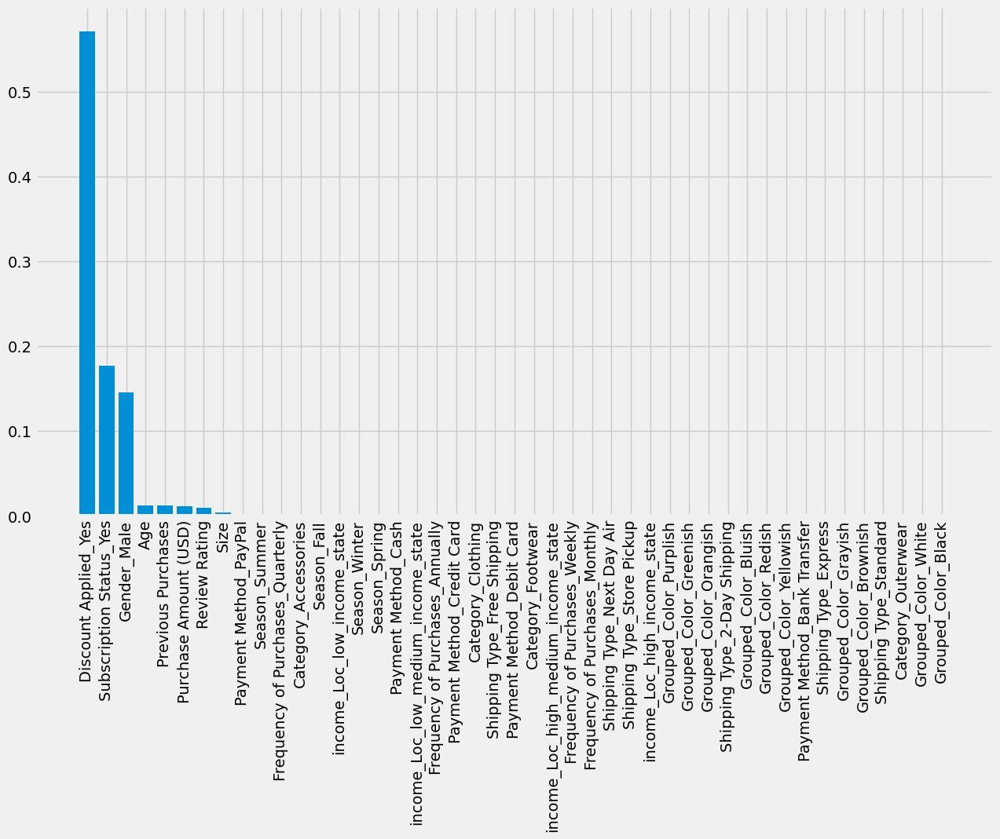

In [65]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imp_rf)), height=list(map(lambda x: x[0], f_imp_rf)))

<BarContainer object of 45 artists>

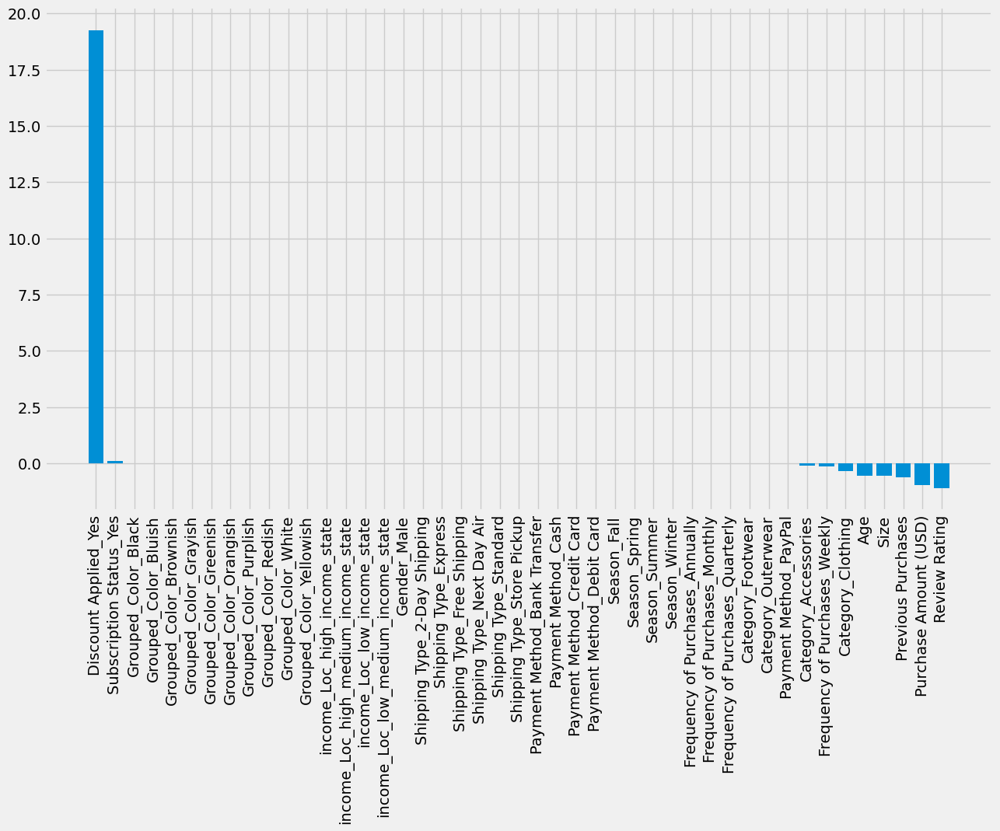

In [66]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imp_lasso)), height=list(map(lambda x: x[0], f_imp_lasso)))

In [67]:
pca = PCA(n_components=dataset_f.shape[1])
fed = pca.fit_transform(dataset_f)

([<matplotlib.axis.XTick at 0x7f819db22fa0>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23'),
  Text(24, 0, '24'),
  Text(25, 0, '25'),
  Text(26, 0, '26'),
  Text(27, 0, '27'),
  Text(28, 0, '28'),
  Text(29, 0, '29'),
  Text(30, 0, '30'),
  Text(31, 0, '31'),
  Text(32, 0, '32'),
  Text(33, 0, '33'),
  Text(34, 0, '34'),
  Text(35, 0, '35'),
  Text(36, 0, '36'),
  Text(37, 0, '37'),
  Text(38, 0, '38'),
  Text(39, 0, '39'),
  Text(40, 0, '40'),
  Text(41, 0, '41'),
  Text(42, 0, '42'),
  Text(43, 0, '43'),
  Text(44, 0, '44'),
  Text(45, 0, '45')])

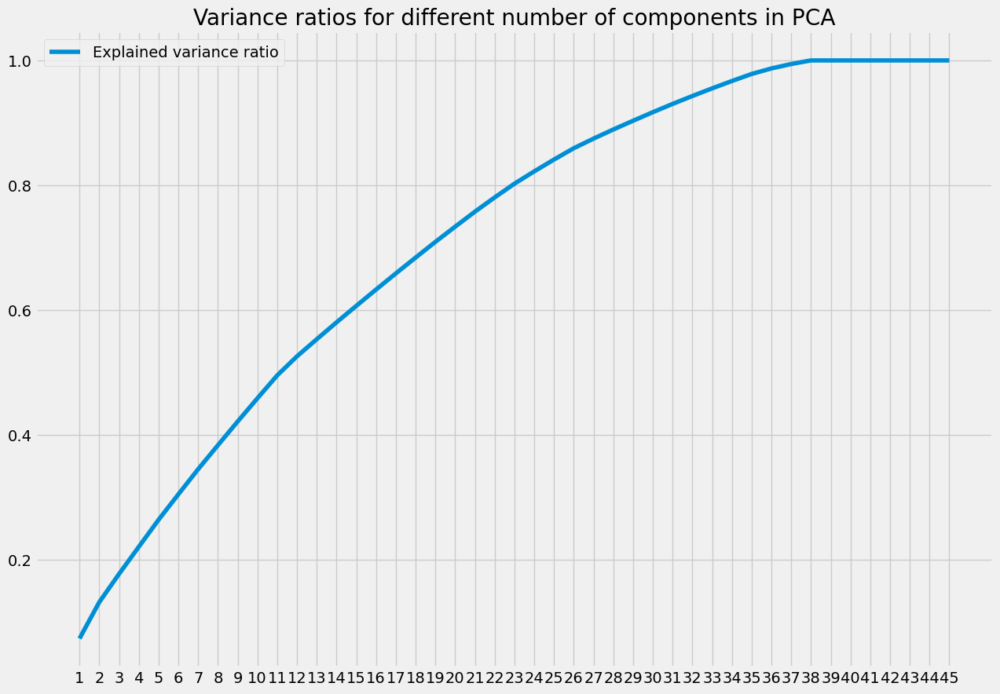

In [68]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.title("Variance ratios for different number of components in PCA")
plt.plot(np.arange(1, dataset_f.shape[1] + 1), pca.explained_variance_ratio_.cumsum(), label="Explained variance ratio")
plt.legend()
plt.xticks(np.arange(1, dataset_f.shape[1] + 1))

In [69]:
pca = PCA(n_components=30)

dataset_pca = pca.fit_transform(dataset_f)

In [70]:
#c_labels = ac.fit_predict(dataset_pca)
c_labels2 = kmeans2.fit_predict(dataset_pca)

In [71]:
silhouette_score(dataset_pca, c_labels2)

0.06800340283533968

2d PCA - explained variances: [0.08043201 0.0635527 ]
3d PCA - explained variances: [0.08043201 0.0635527  0.04927085]


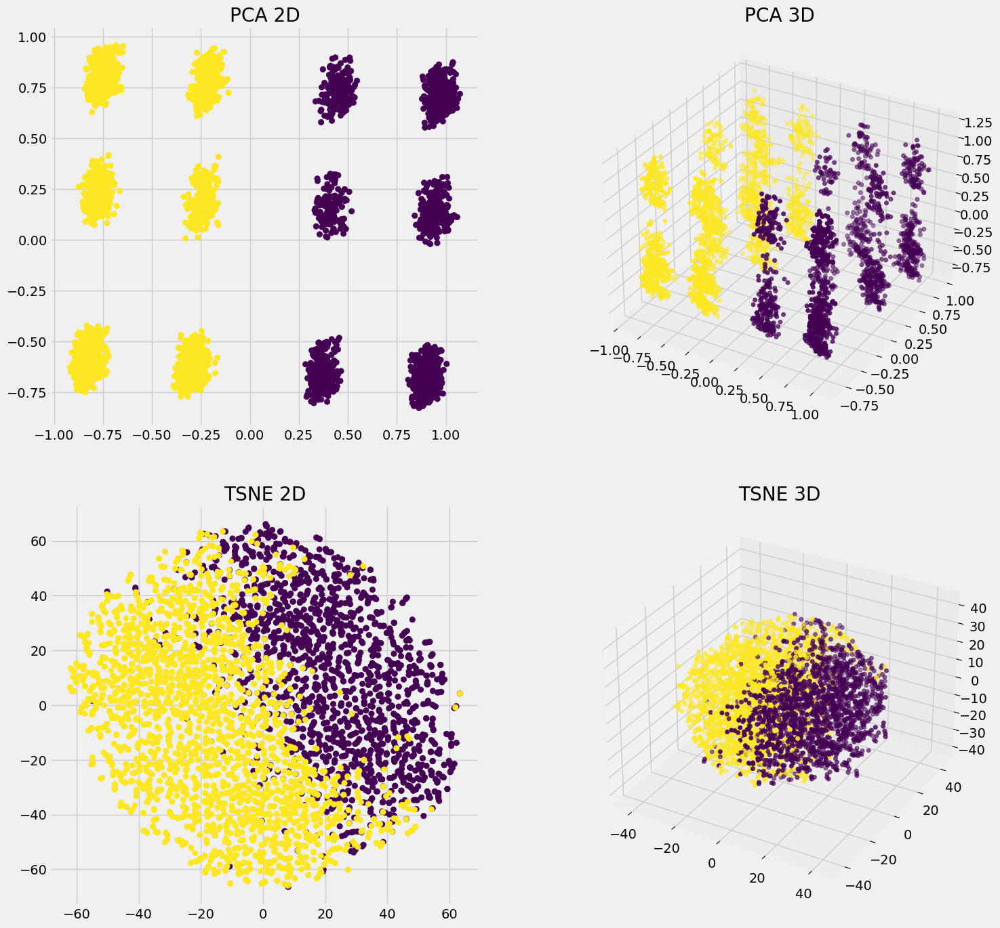

In [72]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_pca, c_labels2, ax=(ax1, ax2, ax3, ax4))

In [73]:
dataset = dataset_grouped.copy(deep=True)
dataset["cluster"] = c_labels2
dataset["cluster"].value_counts()

cluster
1    2223
0    1677
Name: count, dtype: int64

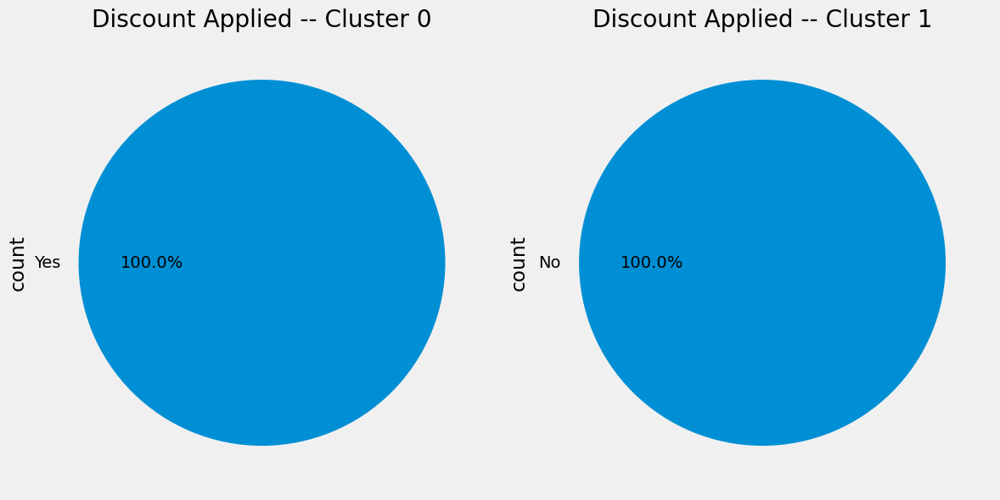

In [74]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Discount Applied"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Discount Applied -- Cluster {cluster_id}")

fig.tight_layout()

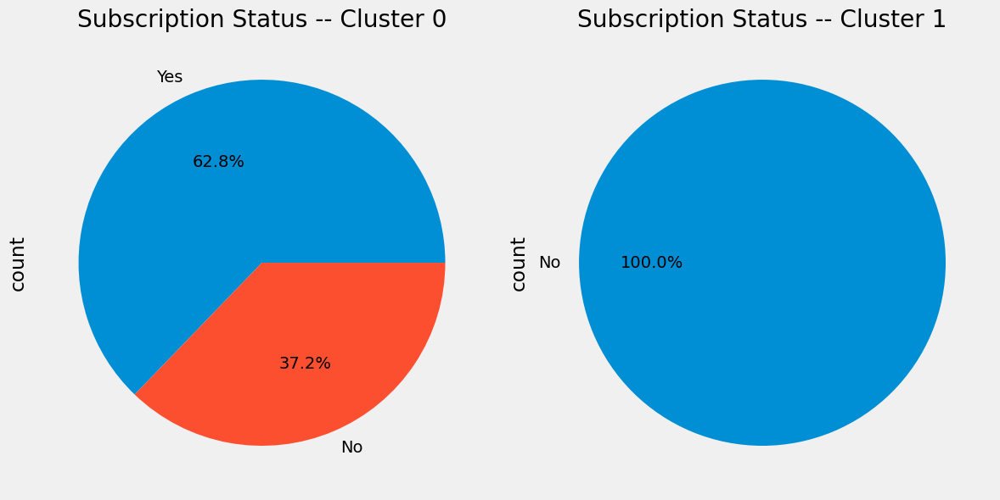

In [75]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Subscription Status"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Subscription Status -- Cluster {cluster_id}")

fig.tight_layout()

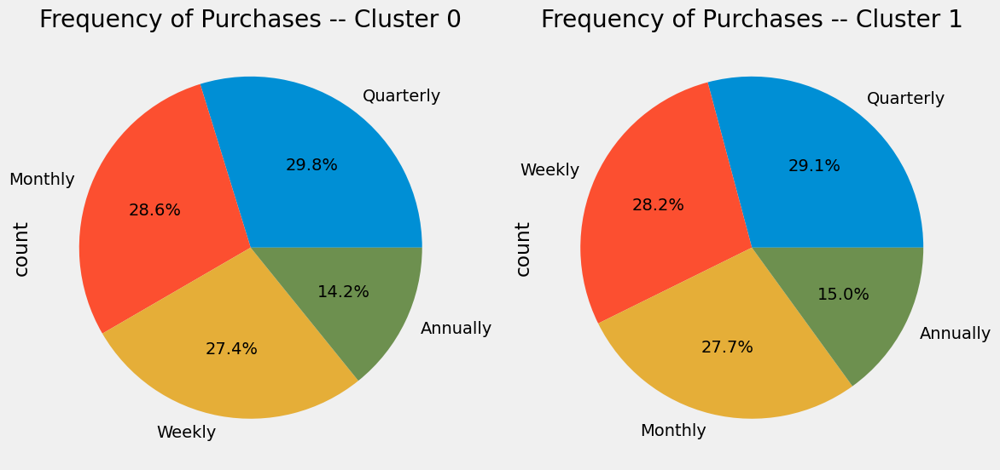

In [76]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Frequency of Purchases"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Frequency of Purchases -- Cluster {cluster_id}")

fig.tight_layout()

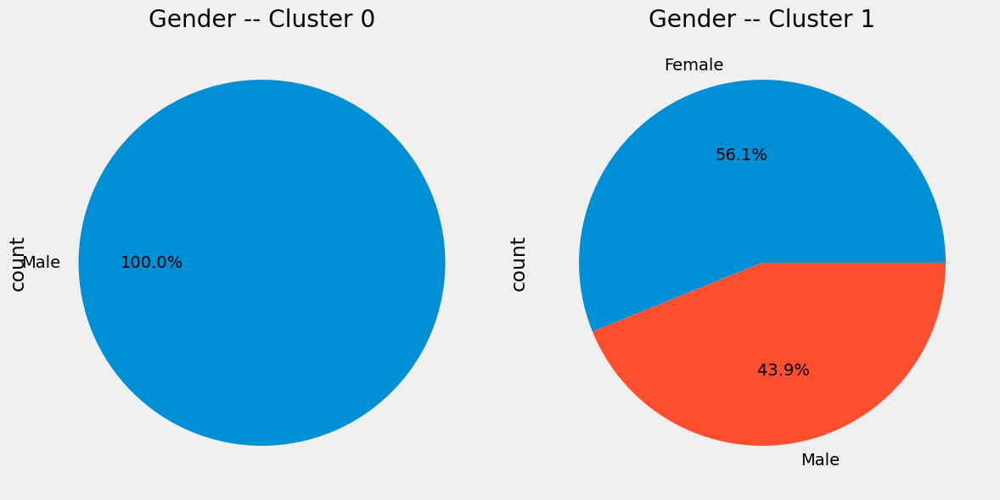

In [77]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Gender"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Gender -- Cluster {cluster_id}")

fig.tight_layout()

cluster  Payment Method
0        Bank Transfer    0.154
         Cash             0.169
         Credit Card      0.167
         Debit Card       0.172
         PayPal           0.338
1        Bank Transfer    0.159
         Cash             0.174
         Credit Card      0.176
         Debit Card       0.156
         PayPal           0.335
Name: proportion, dtype: float64

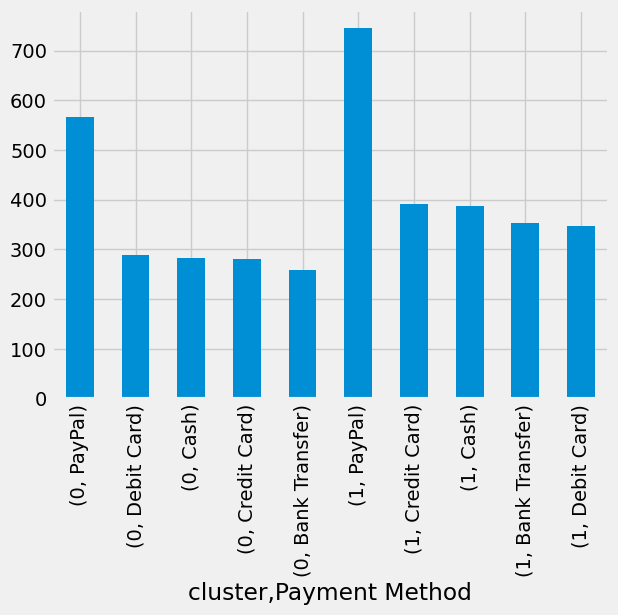

In [78]:
dataset.groupby("cluster")["Payment Method"].value_counts().plot(kind="bar")
dataset.groupby("cluster")["Payment Method"].value_counts(normalize=True).sort_index()

cluster  income_Loc              
0        high_income_state          0.252
         high_medium_income_state   0.236
         low_income_state           0.278
         low_medium_income_state    0.234
1        high_income_state          0.256
         high_medium_income_state   0.247
         low_income_state           0.256
         low_medium_income_state    0.242
Name: proportion, dtype: float64

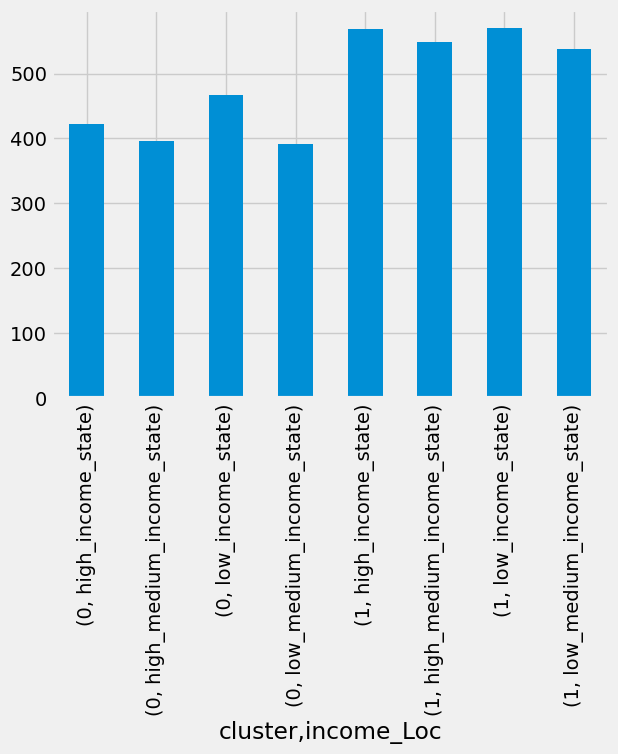

In [79]:
dataset.groupby("cluster")["income_Loc"].value_counts().sort_index().plot(kind="bar")
dataset.groupby("cluster")["income_Loc"].value_counts(normalize=True).sort_index()

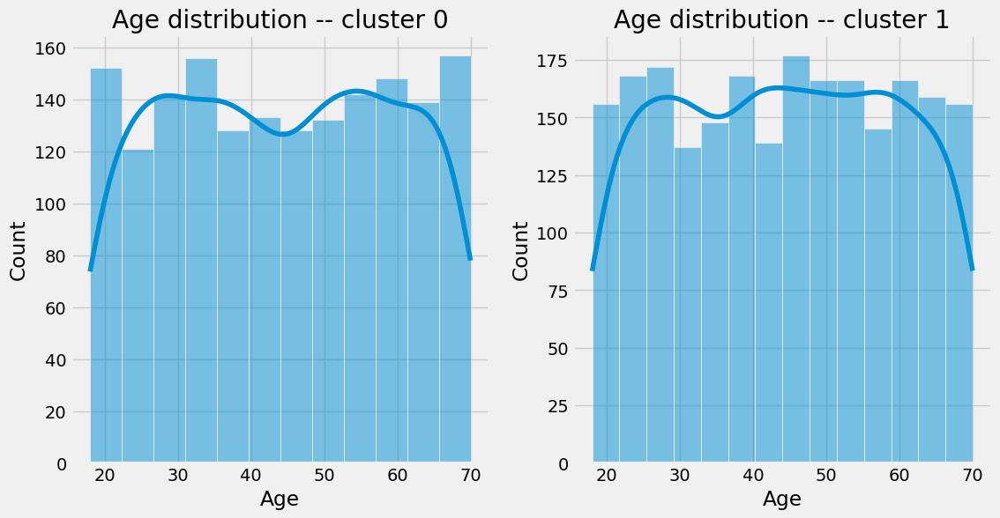

In [80]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Age", ax=ax[i], kde=True)
    ax[i].set_title(f"Age distribution -- cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - age distribution')

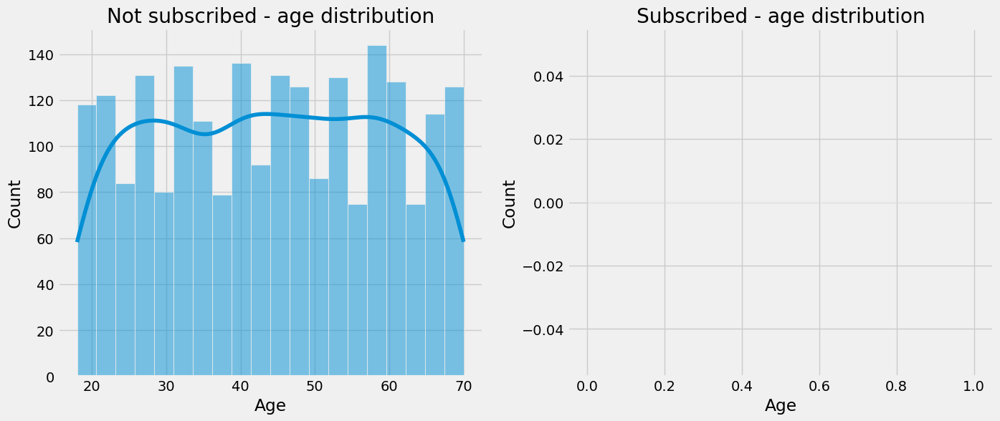

In [81]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "No")], x="Age", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - age distribution")

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "Yes")], x="Age", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - age distribution")

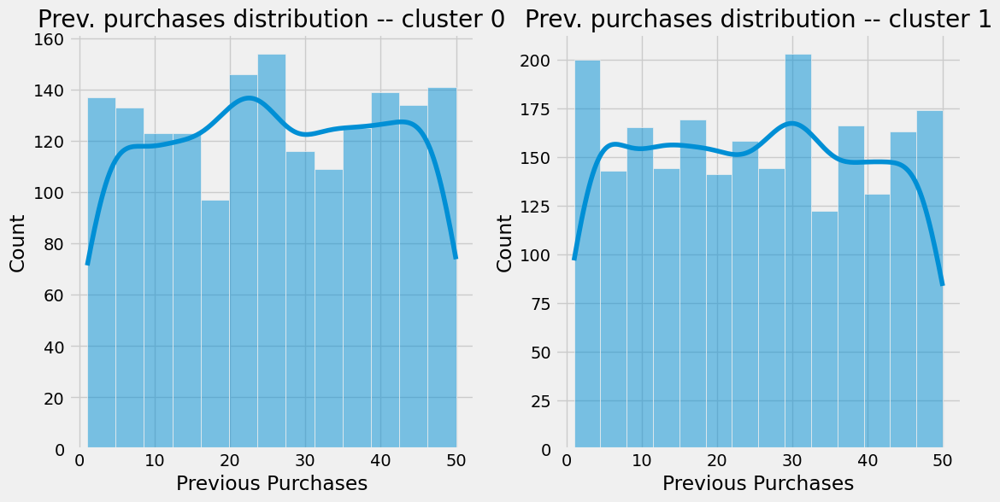

In [82]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Previous Purchases", ax=ax[i], kde=True)
    ax[i].set_title(f"Prev. purchases distribution -- cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - prev. purchases')

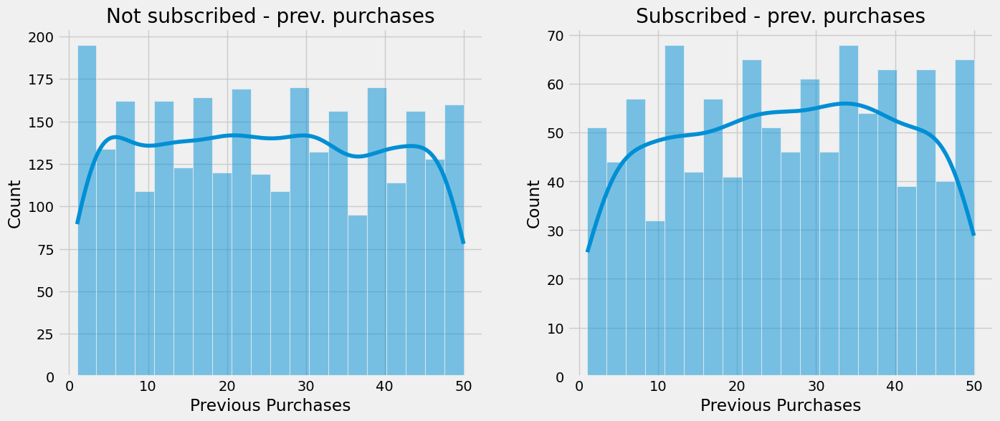

In [83]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["Subscription Status"] == "No")], x="Previous Purchases", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - prev. purchases")

sns.histplot(data=dataset[(dataset["Subscription Status"] == "Yes")], x="Previous Purchases", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - prev. purchases")

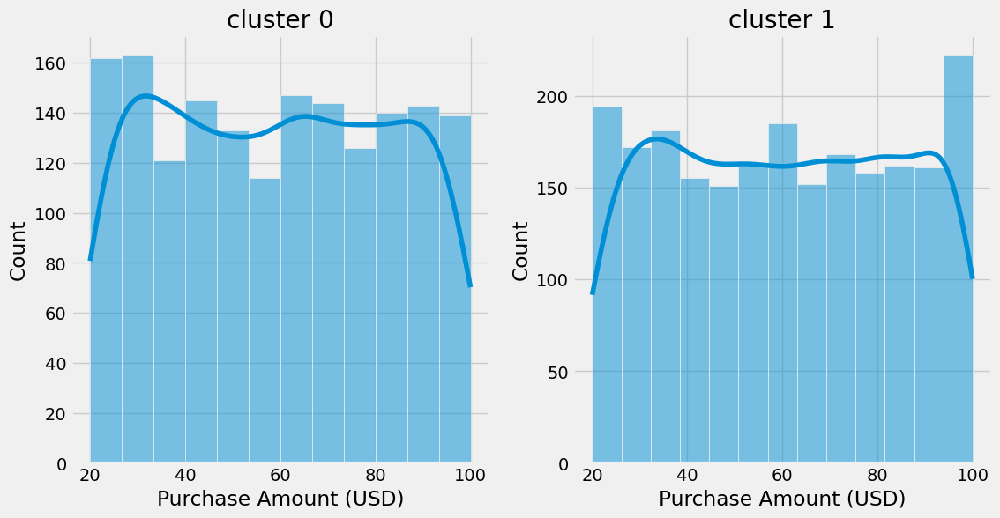

In [84]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Purchase Amount (USD)", ax=ax[i], kde=True)
    ax[i].set_title(f"cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - age distribution')

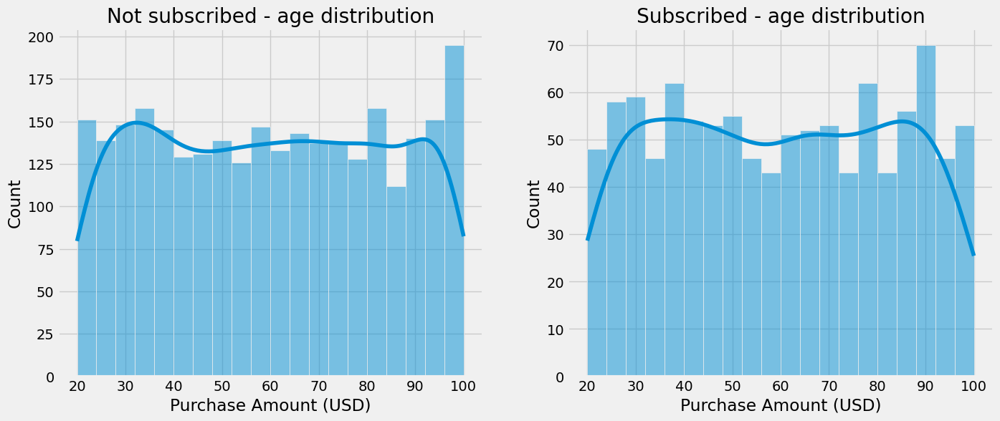

In [85]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["Subscription Status"] == "No")], x="Purchase Amount (USD)", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - age distribution")

sns.histplot(data=dataset[(dataset["Subscription Status"] == "Yes")], x="Purchase Amount (USD)", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - age distribution")

Nismo dobili znacajnije rezultate koji se odnose na vrednost porudzbine.

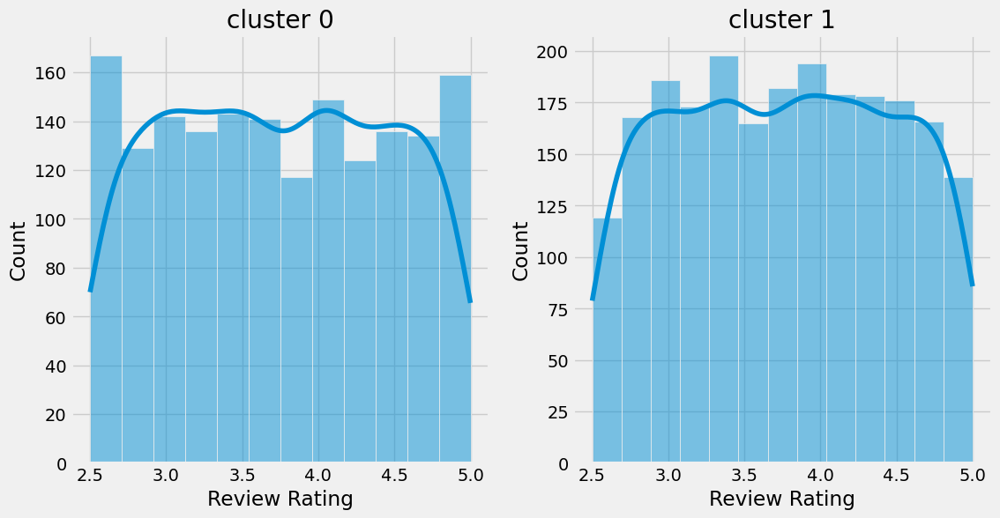

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Review Rating", ax=ax[i], kde=True)
    ax[i].set_title(f"cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - review rating distribution')

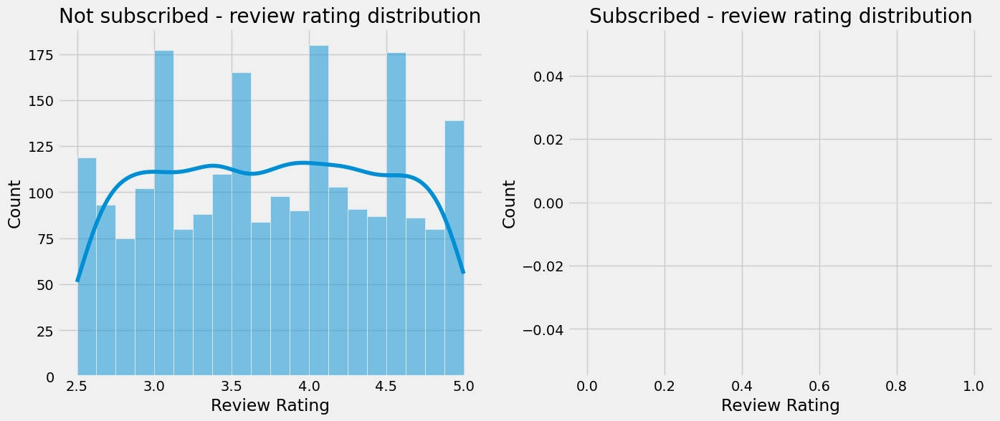

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "No")], x="Review Rating", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - review rating distribution")

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "Yes")], x="Review Rating", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - review rating distribution")

Nismo dobili znacajnije rezultate koji se ticu vrednosti porudzbine.

cluster  Category   
0        Accessories   0.324
         Clothing      0.436
         Footwear      0.154
         Outerwear     0.086
1        Accessories   0.314
         Clothing      0.453
         Footwear      0.153
         Outerwear     0.081
Name: proportion, dtype: float64

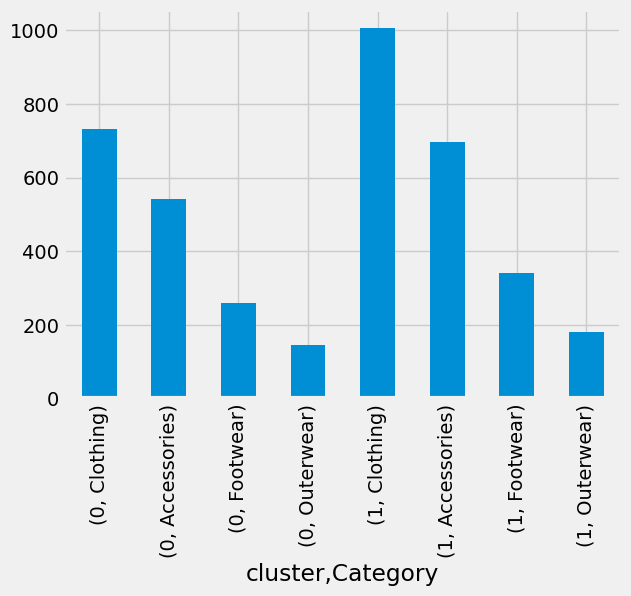

In [88]:
dataset.groupby("cluster")["Category"].value_counts().plot(kind="bar")
dataset.groupby("cluster")["Category"].value_counts(normalize=True).sort_index()

**Zakljucak:** Podaci su grupisani u dva klastera na osnovu toga da li je pri kupovini iskoriscen popust. Popuste su uglavnom koristili neki pretplaceni korisnici - njih 62%. <br>
Takodje, mozda je bitnija informacija da su pretplaceni clanovi iskljucivo muskog pola. <br>
Nismo dobili znacajnije razlike za preferirani nacin placanja i kategoriju proizvoda koji su korisnici kupovali. <br>
Jos jedna potencijalno znacajna informacija je da ima manje pretplacenih korisnika izmedju 40-50 godina u odnosu na ostale godine. <br>
U klasteru 1 (u kome su svi koristili popust) postoji **neznatno** vise ljudi koji dolazi iz drzava sa malim prihodom. <br>
Pretplaceni korisnici ovi rezultati mogu da sluze kao smernica za ciljanu reklamu ka odredjenim grupama, jer pretplaceni korisnici imaju vise narudzbina!

### KMeans 2 klastera, feature selection

Izbacivanjem nekih atributa koji su nebitni prilikom klasterizacije (na osnovu njihove Feature Importance vrednosti) dobili smo bolje rezultate za silhouette score.

***NAPOMENA***: brisemo samo atribute koji su i intuitivno manje bitni,a takodje imaju nisku vrednost za Feature Importance. Takvi atributi su npr. "Size", "Season" i "Grouped_Color" za pocetak.

In [89]:
dataset_base = dataset_base_og.drop(["Size", "Season", "Grouped_Color", "Category"], axis=1)

In [90]:
dataset_base.head()

,Age,Gender,Purchase Amount (USD),Review Rating,Subscription Status,Shipping Type,Discount Applied,Previous Purchases,Payment Method,Frequency of Purchases,income_Loc
0,55,Male,53,3.100,Yes,Express,Yes,14,PayPal,Monthly,low_income_state
1,19,Male,64,3.100,Yes,Express,Yes,2,Cash,Monthly,low_medium_income_state
2,50,Male,73,3.100,Yes,Free Shipping,Yes,23,Credit Card,Weekly,high_income_state
3,21,Male,90,3.500,Yes,Next Day Air,Yes,49,PayPal,Weekly,high_medium_income_state
4,45,Male,49,2.700,Yes,Free Shipping,Yes,31,PayPal,Annually,high_medium_income_state


In [91]:
trns = make_transformer(dataset_base, low_cardinality_columns, high_cardinality_columns, minimize_n_feat=False)

dataset_f = trns.fit_transform(dataset_base)

In [92]:
kmeans2.fit(dataset_f)
c_labels2 = kmeans2.predict(dataset_f)

In [93]:
silhouette_score(dataset_f, c_labels2)

0.10070225635099751

In [94]:
f_imp_rf, f_imp_lasso = get_feature_importances(dataset_f, c_labels2)

<BarContainer object of 26 artists>

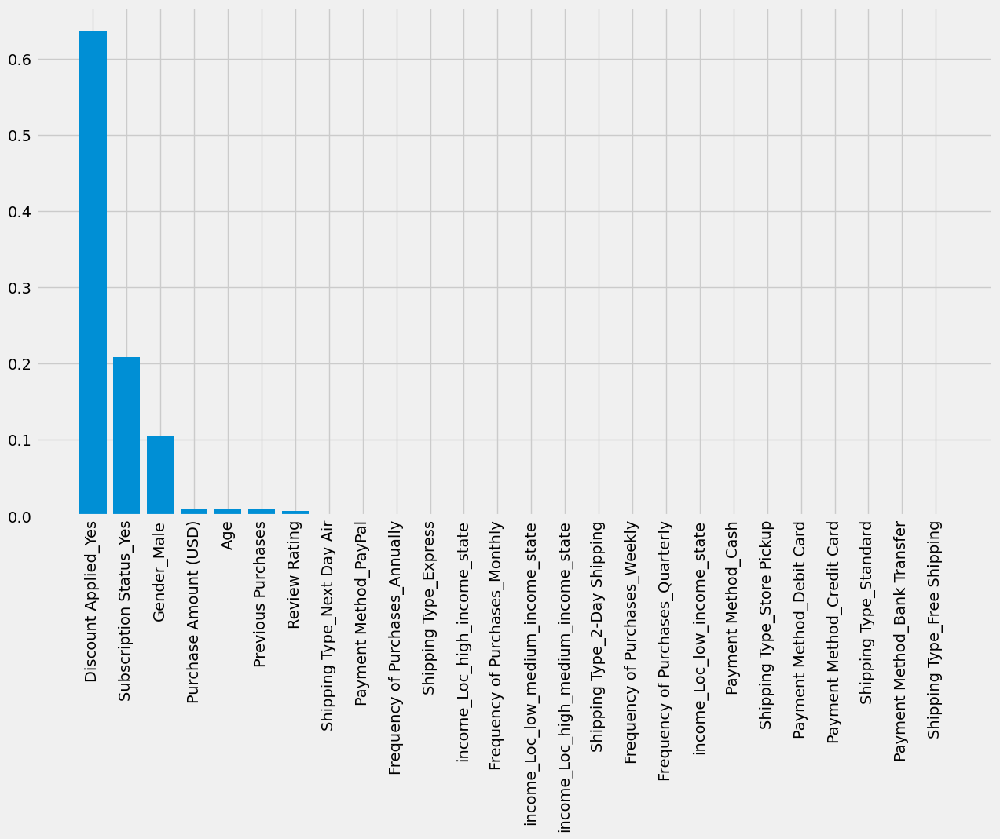

In [95]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imp_rf)), height=list(map(lambda x: x[0], f_imp_rf)))

<BarContainer object of 26 artists>

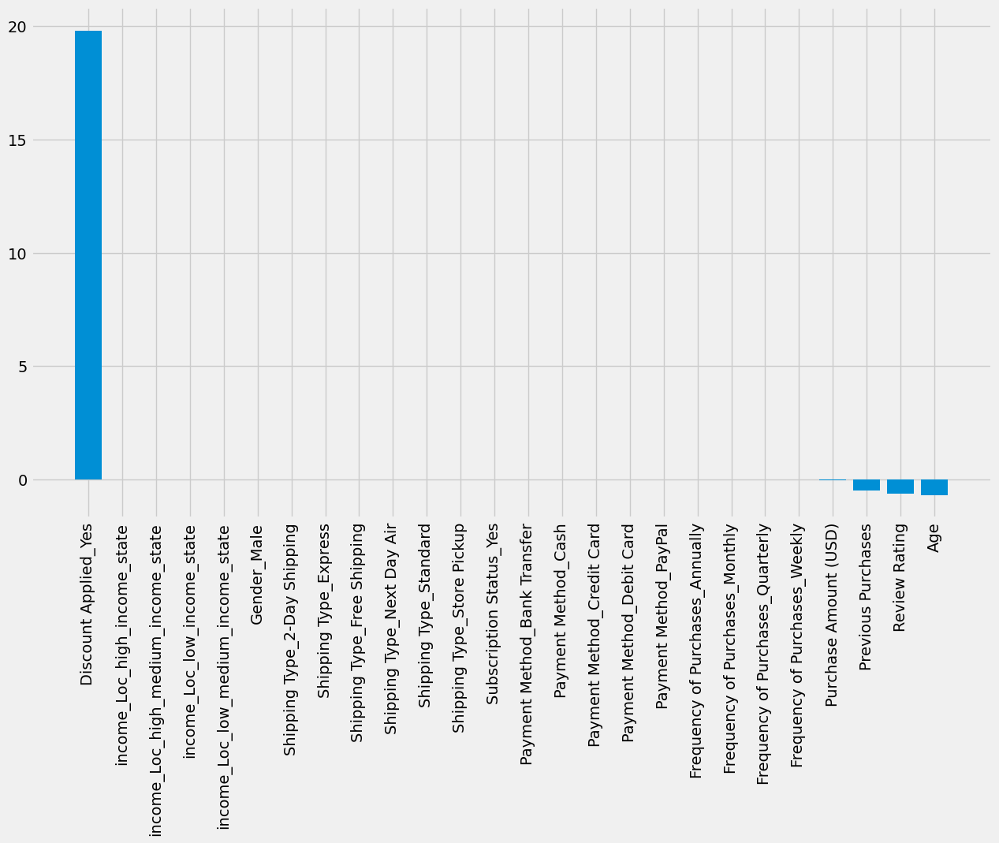

In [96]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imp_lasso)), height=list(map(lambda x: x[0], f_imp_lasso)))

In [97]:
pca = PCA(n_components=dataset_f.shape[1])
fed = pca.fit_transform(dataset_f)

([<matplotlib.axis.XTick at 0x7f8194db1730>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23'),
  Text(24, 0, '24'),
  Text(25, 0, '25'),
  Text(26, 0, '26')])

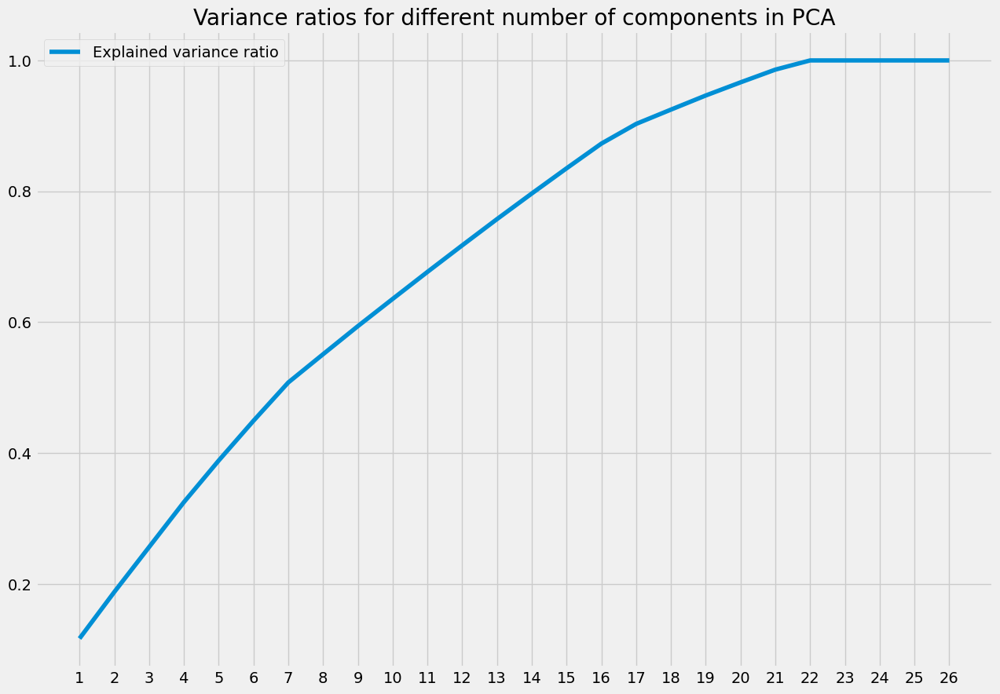

In [98]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.title("Variance ratios for different number of components in PCA")
plt.plot(np.arange(1, dataset_f.shape[1] + 1), pca.explained_variance_ratio_.cumsum(), label="Explained variance ratio")
plt.legend()
plt.xticks(np.arange(1, dataset_f.shape[1] + 1))

In [99]:
pca = PCA(n_components=20)

dataset_pca = pca.fit_transform(dataset_f)

In [100]:
#c_labels = ac.fit_predict(dataset_pca)
c_labels2 = kmeans2.fit_predict(dataset_pca)

In [101]:
silhouette_score(dataset_pca, c_labels2)

0.10102117100073894

2d PCA - explained variances: [0.12082693 0.07353645]
3d PCA - explained variances: [0.12082693 0.07353645 0.07104133]


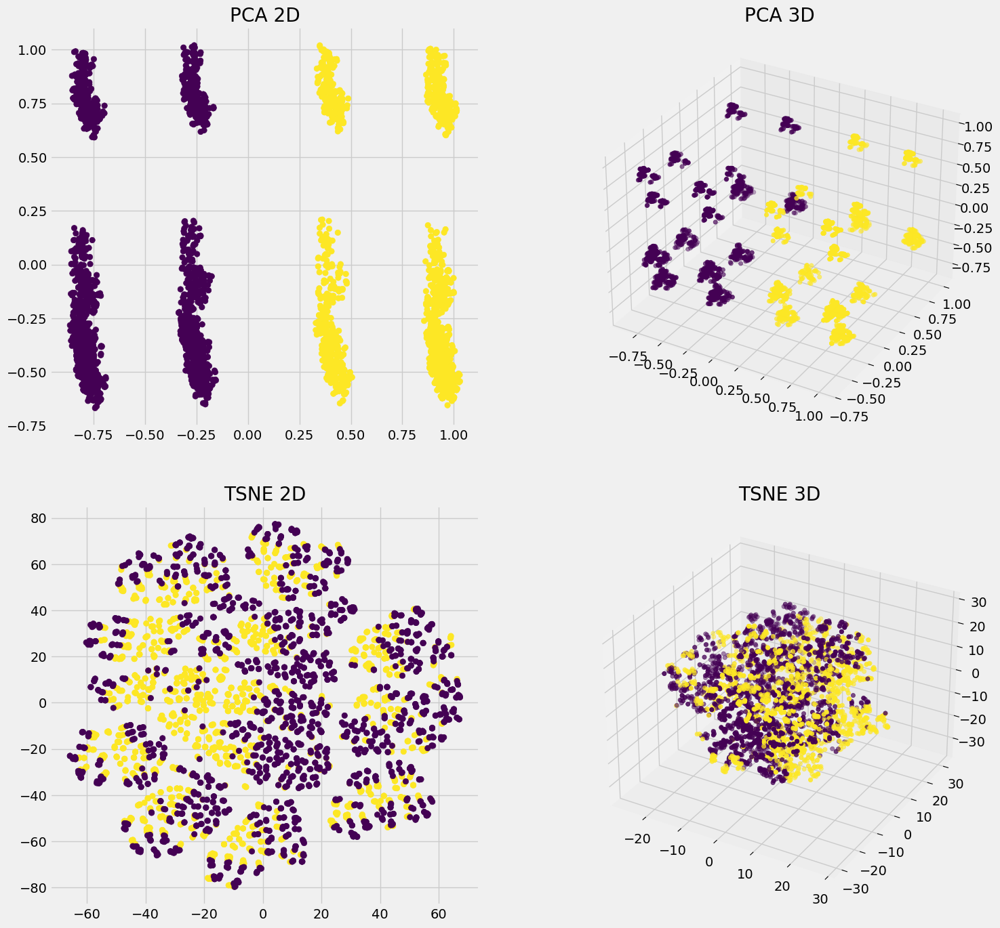

In [102]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_pca, c_labels2, ax=(ax1, ax2, ax3, ax4))

In [103]:
dataset = dataset_grouped.copy(deep=True)
dataset["cluster"] = c_labels2
dataset["cluster"].value_counts()

cluster
0    2223
1    1677
Name: count, dtype: int64

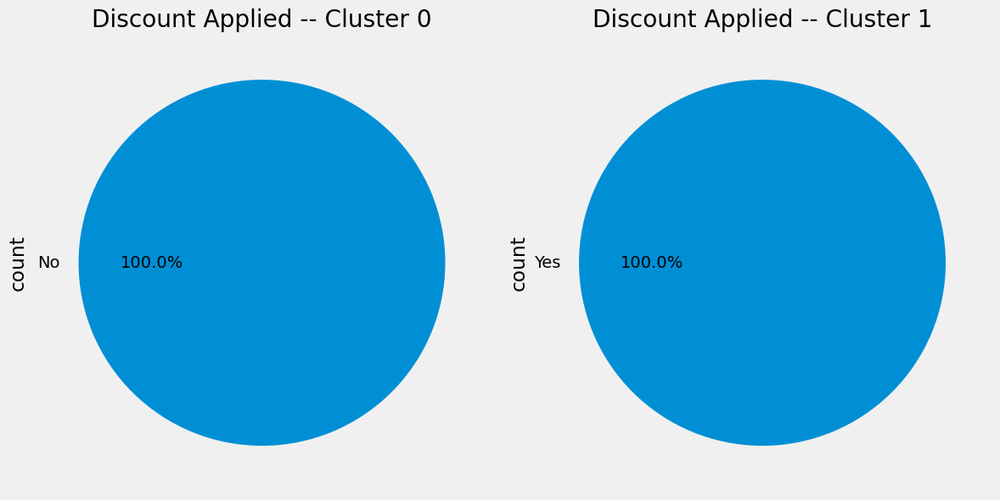

In [104]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Discount Applied"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Discount Applied -- Cluster {cluster_id}")

fig.tight_layout()

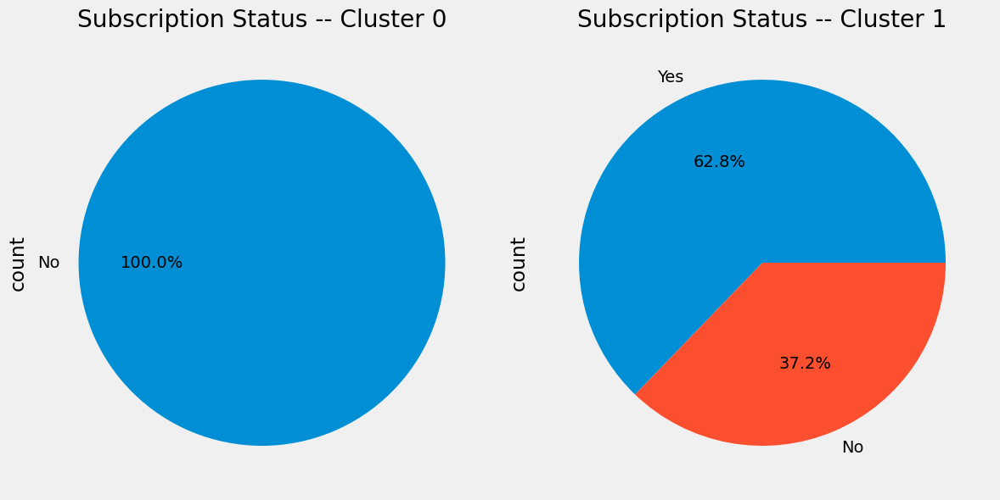

In [105]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Subscription Status"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Subscription Status -- Cluster {cluster_id}")

fig.tight_layout()

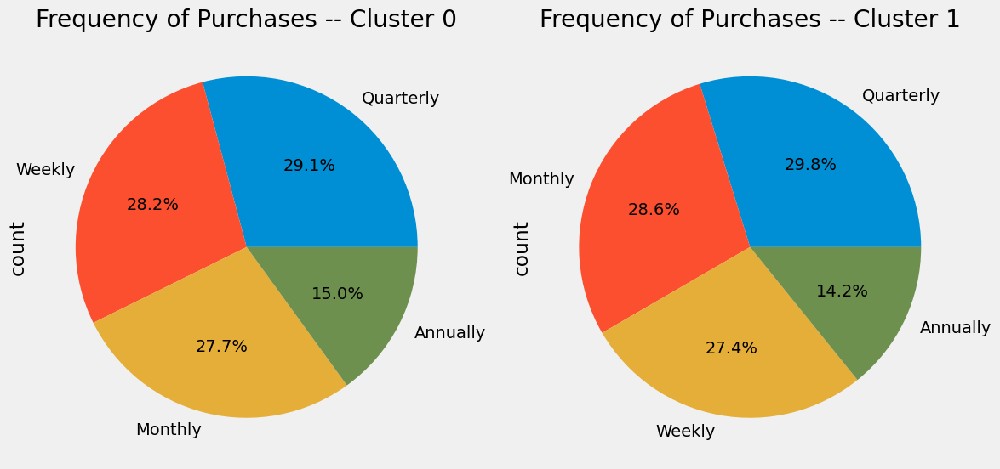

In [106]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Frequency of Purchases"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Frequency of Purchases -- Cluster {cluster_id}")

fig.tight_layout()

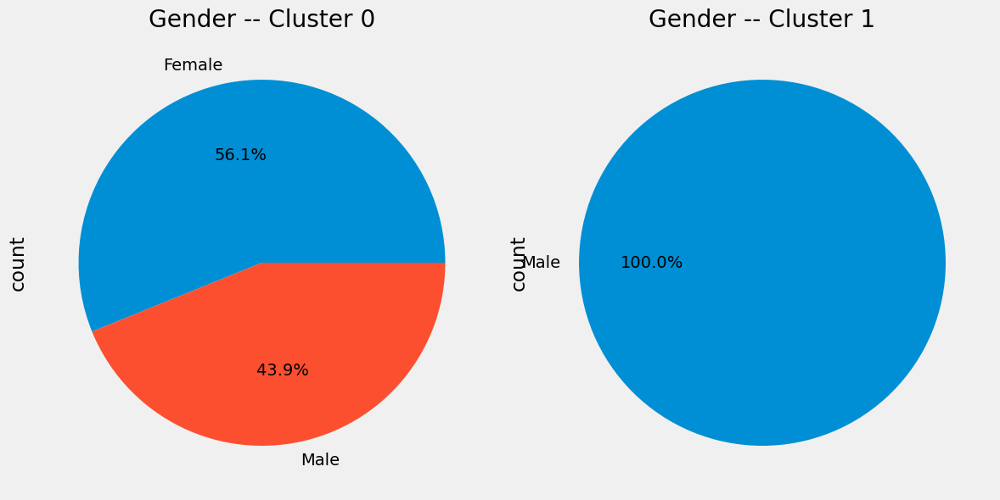

In [107]:
fig, ax = plt.subplots(1, 2, figsize=(12, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Gender"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Gender -- Cluster {cluster_id}")

fig.tight_layout()

cluster  Payment Method
0        Bank Transfer    0.159
         Cash             0.174
         Credit Card      0.176
         Debit Card       0.156
         PayPal           0.335
1        Bank Transfer    0.154
         Cash             0.169
         Credit Card      0.167
         Debit Card       0.172
         PayPal           0.338
Name: proportion, dtype: float64

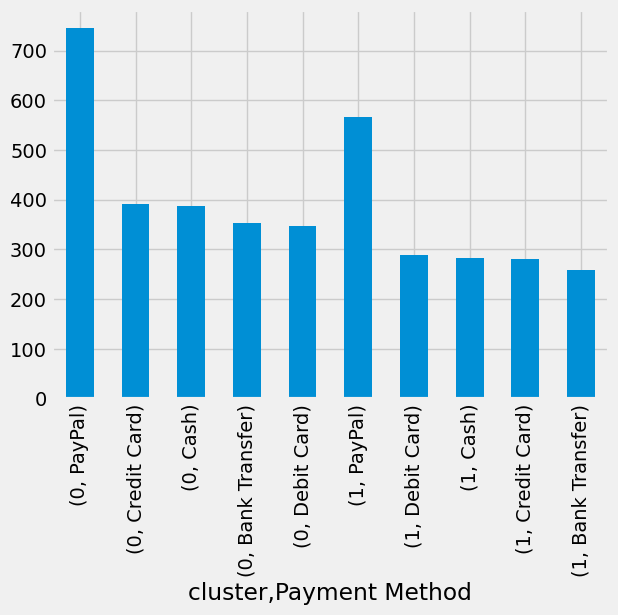

In [108]:
dataset.groupby("cluster")["Payment Method"].value_counts().plot(kind="bar")
dataset.groupby("cluster")["Payment Method"].value_counts(normalize=True).sort_index()

cluster  income_Loc              
0        high_income_state          0.256
         high_medium_income_state   0.247
         low_income_state           0.256
         low_medium_income_state    0.242
1        high_income_state          0.252
         high_medium_income_state   0.236
         low_income_state           0.278
         low_medium_income_state    0.234
Name: proportion, dtype: float64

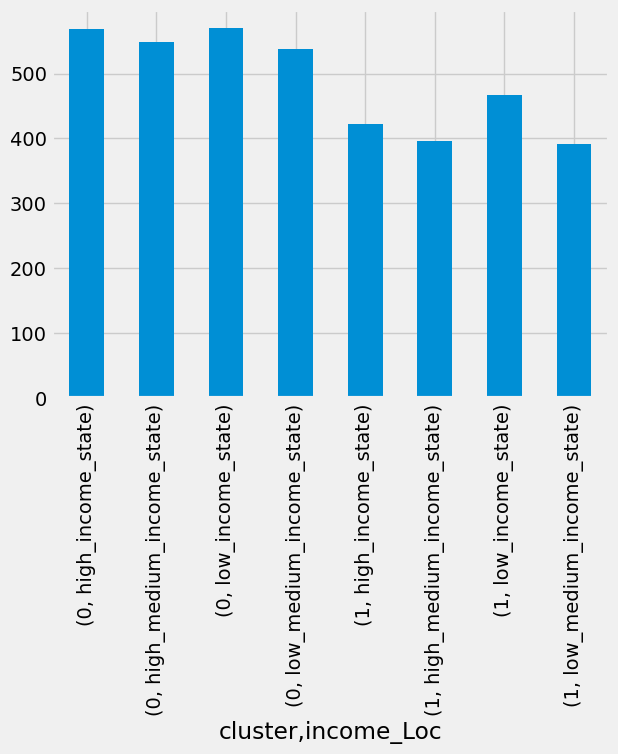

In [109]:
dataset.groupby("cluster")["income_Loc"].value_counts().sort_index().plot(kind="bar")
dataset.groupby("cluster")["income_Loc"].value_counts(normalize=True).sort_index()

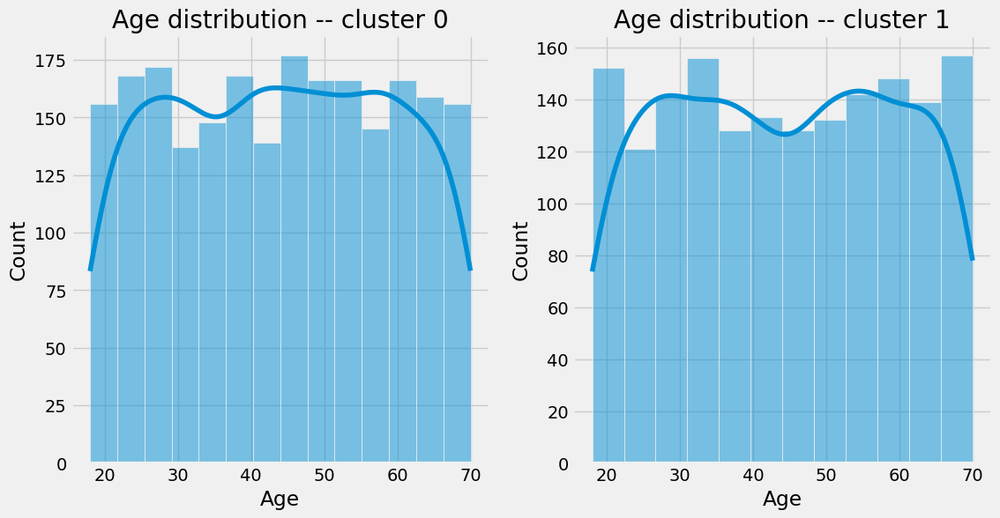

In [110]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Age", ax=ax[i], kde=True)
    ax[i].set_title(f"Age distribution -- cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - age distribution')

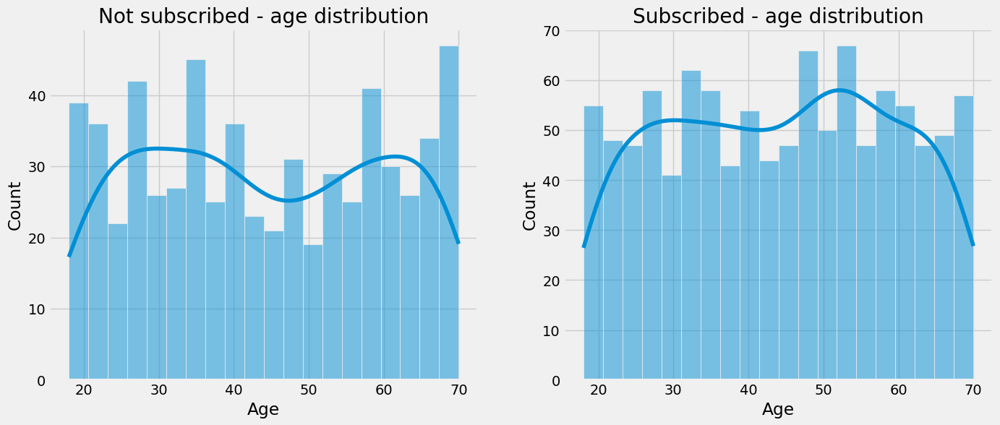

In [111]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "No")], x="Age", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - age distribution")

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "Yes")], x="Age", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - age distribution")

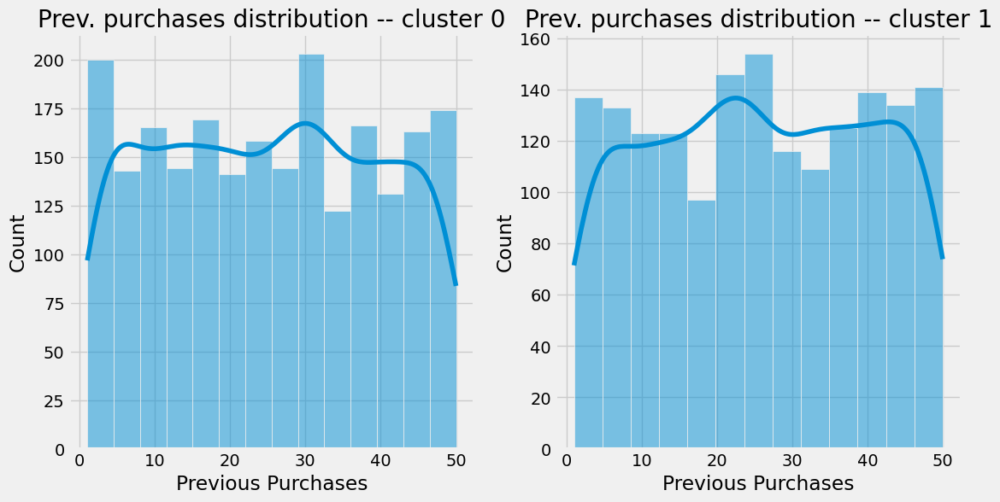

In [112]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Previous Purchases", ax=ax[i], kde=True)
    ax[i].set_title(f"Prev. purchases distribution -- cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - prev. purchases')

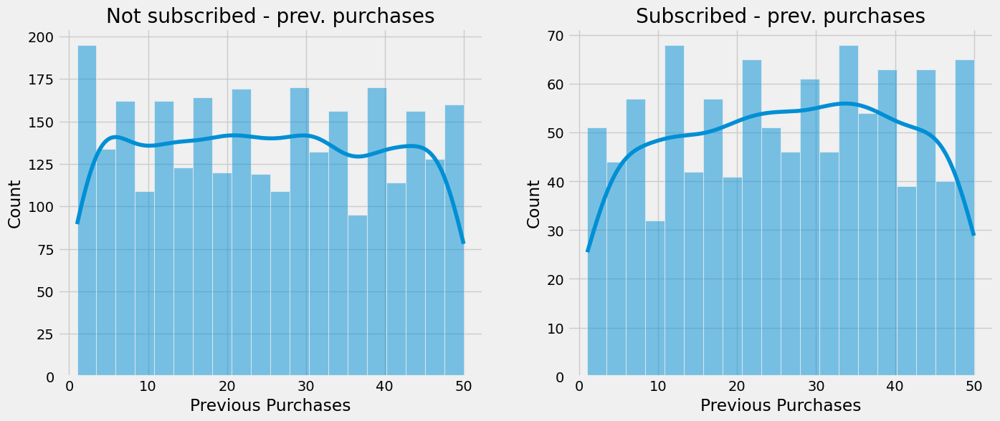

In [113]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["Subscription Status"] == "No")], x="Previous Purchases", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - prev. purchases")

sns.histplot(data=dataset[(dataset["Subscription Status"] == "Yes")], x="Previous Purchases", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - prev. purchases")

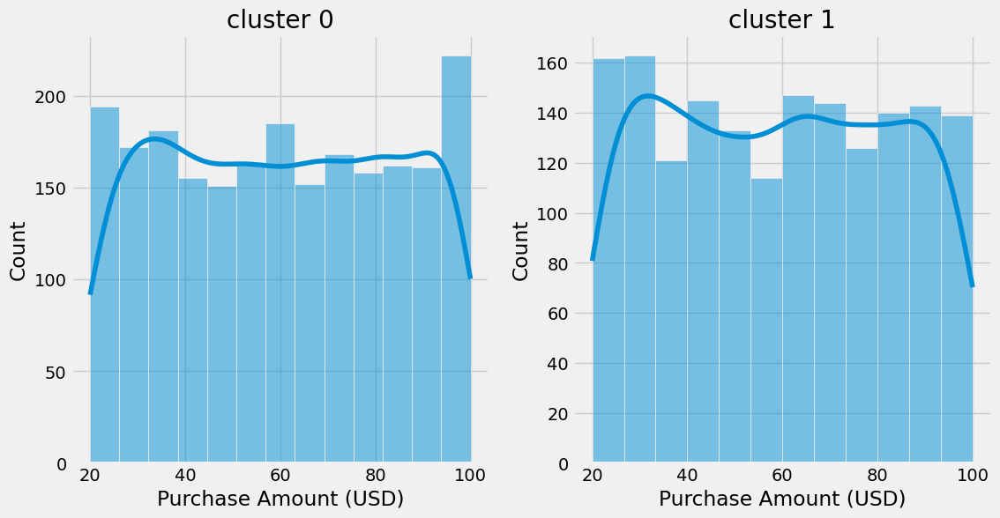

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Purchase Amount (USD)", ax=ax[i], kde=True)
    ax[i].set_title(f"cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - age distribution')

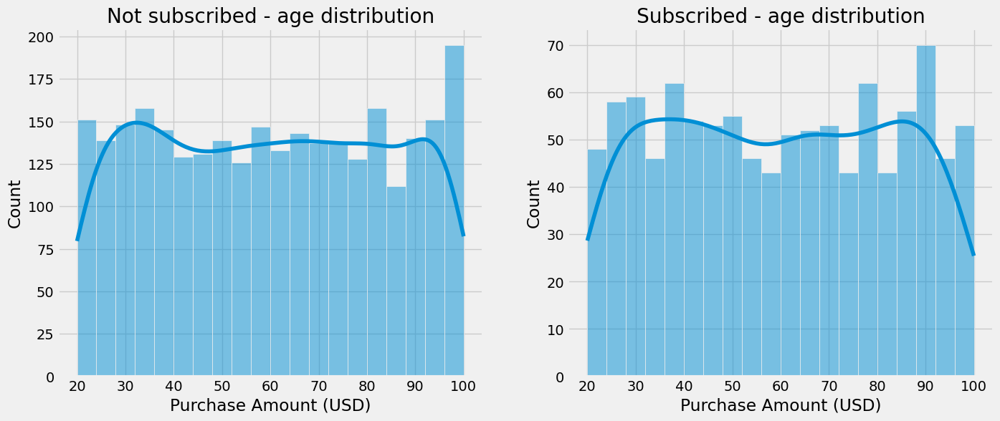

In [115]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["Subscription Status"] == "No")], x="Purchase Amount (USD)", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - age distribution")

sns.histplot(data=dataset[(dataset["Subscription Status"] == "Yes")], x="Purchase Amount (USD)", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - age distribution")

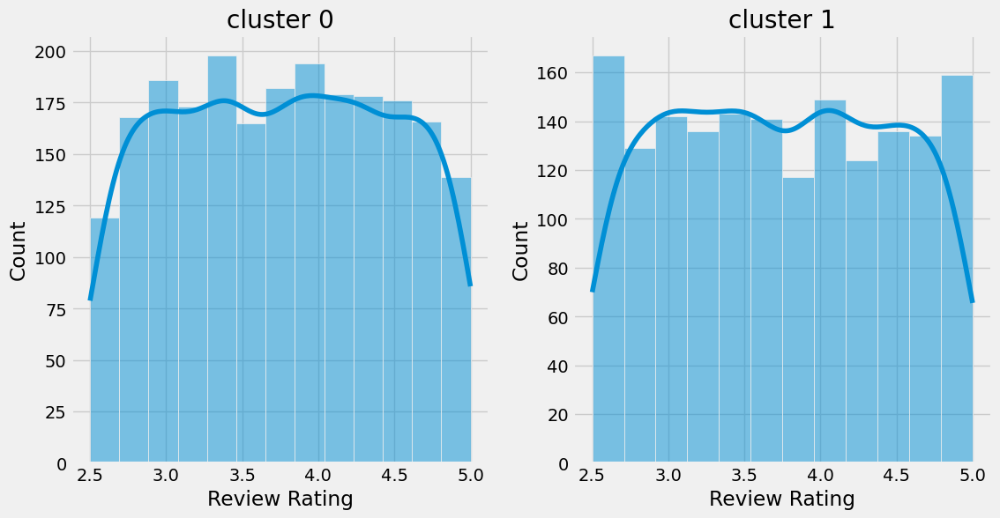

In [116]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    sns.histplot(data=dataset[dataset["cluster"] == cluster_id], x="Review Rating", ax=ax[i], kde=True)
    ax[i].set_title(f"cluster {cluster_id}")

Text(0.5, 1.0, 'Subscribed - review rating distribution')

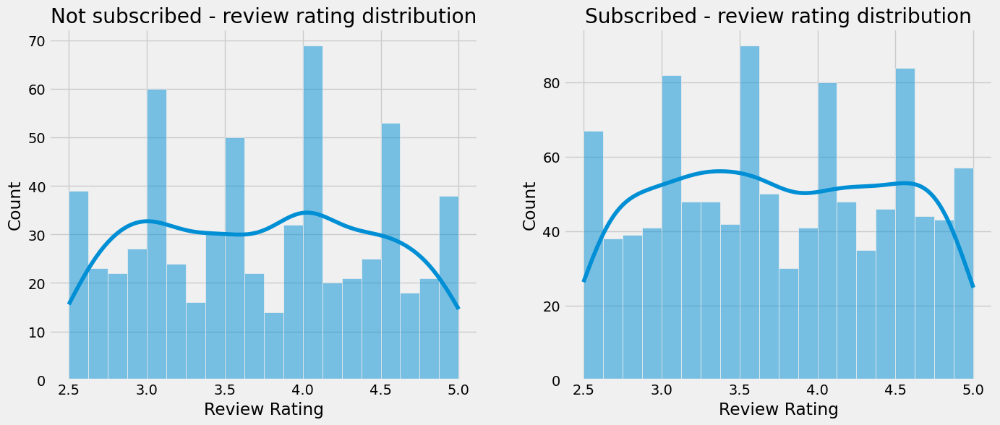

In [117]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "No")], x="Review Rating", ax=ax[0], kde=True, bins=20)
ax[0].set_title(f"Not subscribed - review rating distribution")

sns.histplot(data=dataset[(dataset["cluster"] == 1) & (dataset["Subscription Status"] == "Yes")], x="Review Rating", ax=ax[1], kde=True, bins=20)
ax[1].set_title(f"Subscribed - review rating distribution")

cluster  Category   
0        Accessories   0.314
         Clothing      0.453
         Footwear      0.153
         Outerwear     0.081
1        Accessories   0.324
         Clothing      0.436
         Footwear      0.154
         Outerwear     0.086
Name: proportion, dtype: float64

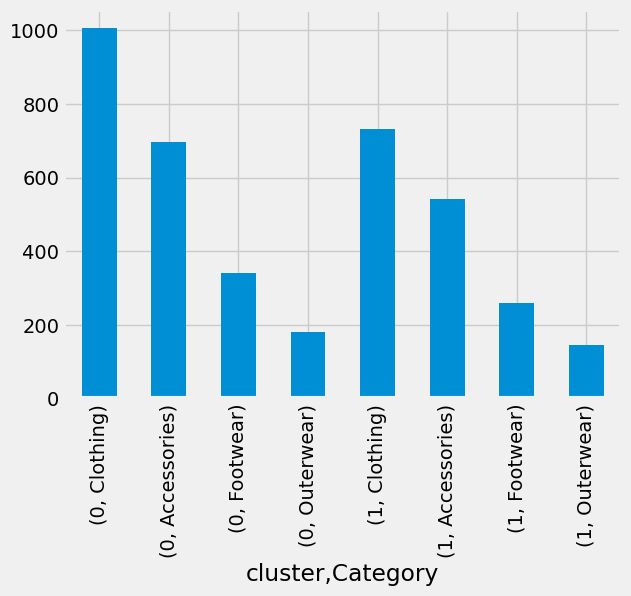

In [118]:
dataset.groupby("cluster")["Category"].value_counts().plot(kind="bar")
dataset.groupby("cluster")["Category"].value_counts(normalize=True).sort_index()

Zakljucak je isti kao i u slucaju svih atributa, medjutim dobili smo bolje izdvojene klastere (veci je silhouette score).

### KMeans 3 klastera, feature selection

In [119]:
dataset_base = dataset_base_og.drop(["Size", "Season", "Grouped_Color", "Category"], axis=1)

In [120]:
dataset_base.head()

,Age,Gender,Purchase Amount (USD),Review Rating,Subscription Status,Shipping Type,Discount Applied,Previous Purchases,Payment Method,Frequency of Purchases,income_Loc
0,55,Male,53,3.100,Yes,Express,Yes,14,PayPal,Monthly,low_income_state
1,19,Male,64,3.100,Yes,Express,Yes,2,Cash,Monthly,low_medium_income_state
2,50,Male,73,3.100,Yes,Free Shipping,Yes,23,Credit Card,Weekly,high_income_state
3,21,Male,90,3.500,Yes,Next Day Air,Yes,49,PayPal,Weekly,high_medium_income_state
4,45,Male,49,2.700,Yes,Free Shipping,Yes,31,PayPal,Annually,high_medium_income_state


In [121]:
trns = make_transformer(dataset_base, low_cardinality_columns, high_cardinality_columns, minimize_n_feat=False)

dataset_f = trns.fit_transform(dataset_base)

In [122]:
kmeans3.fit(dataset_f)
c_labels3 = kmeans3.predict(dataset_f)

In [123]:
silhouette_score(dataset_f, c_labels3)

0.08029008133653134

In [124]:
f_imp_rf, f_imp_lasso = get_feature_importances(dataset_f, c_labels3)

<BarContainer object of 26 artists>

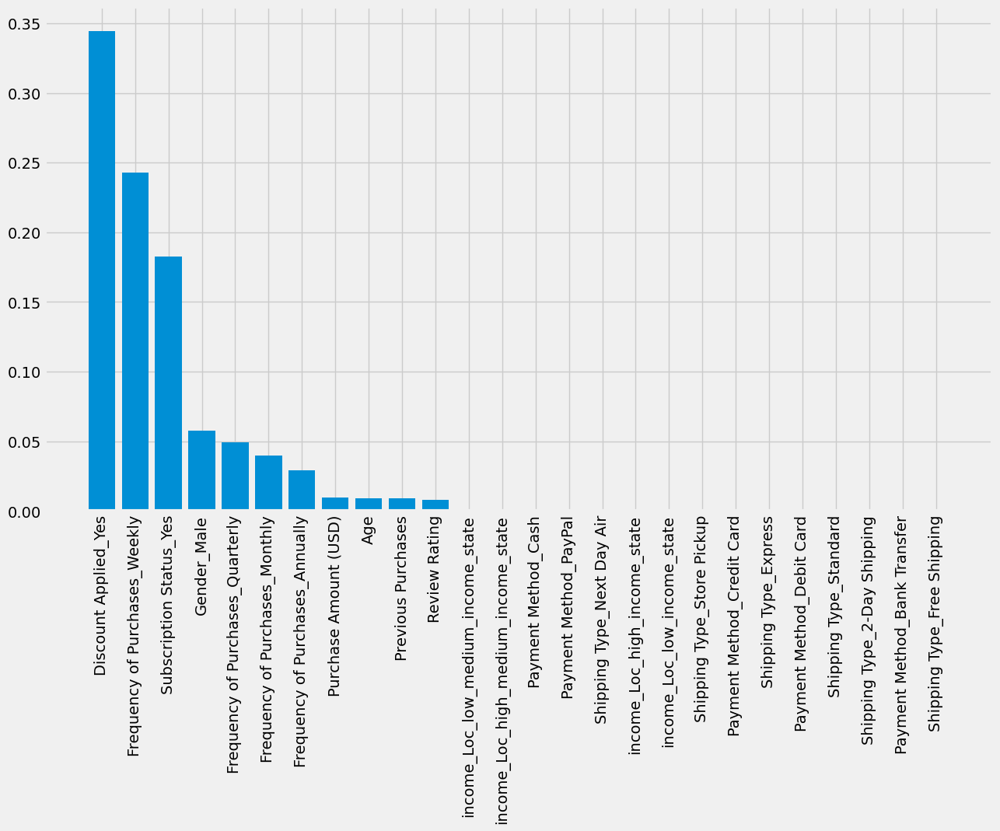

In [125]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imp_rf)), height=list(map(lambda x: x[0], f_imp_rf)))

<BarContainer object of 26 artists>

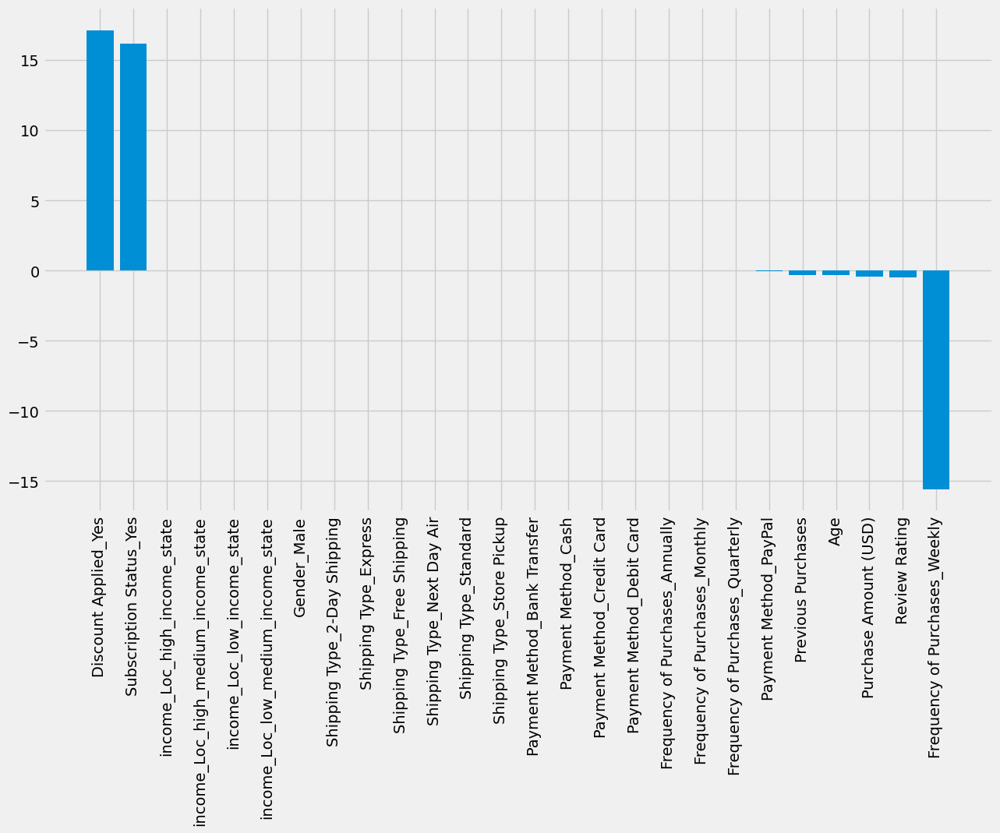

In [126]:
fig, ax = plt.subplots(1, figsize=(14, 8))
plt.xticks(rotation=90)

ax.bar(x=list(map(lambda x: x[1], f_imp_lasso)), height=list(map(lambda x: x[0], f_imp_lasso)))

In [127]:
pca = PCA(n_components=dataset_f.shape[1])
fed = pca.fit_transform(dataset_f)

([<matplotlib.axis.XTick at 0x7f8190052bb0>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23'),
  Text(24, 0, '24'),
  Text(25, 0, '25'),
  Text(26, 0, '26')])

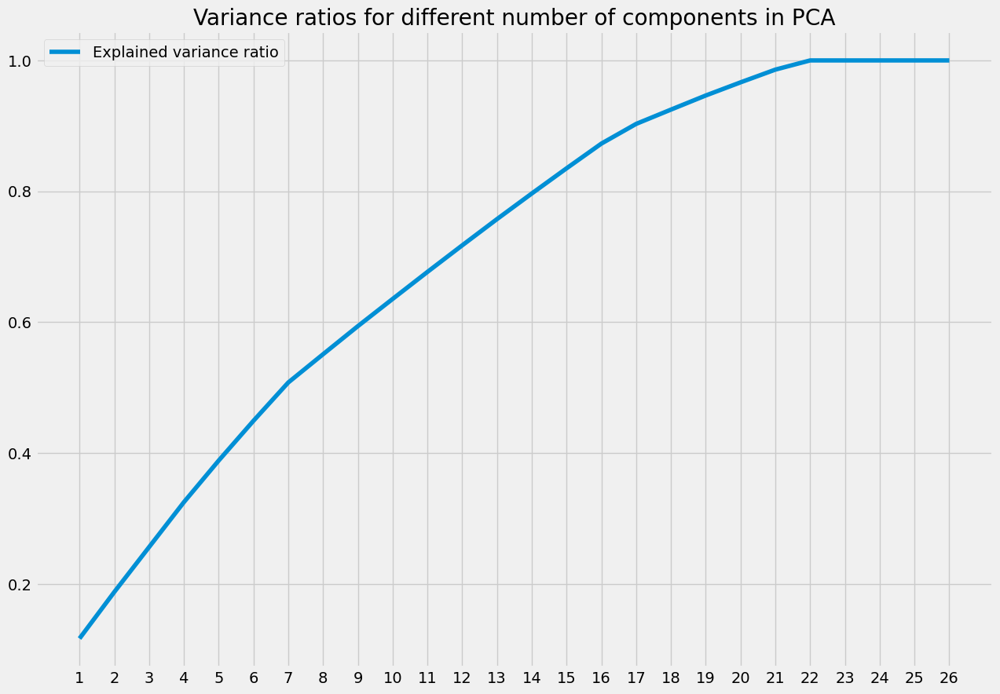

In [128]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.title("Variance ratios for different number of components in PCA")
plt.plot(np.arange(1, dataset_f.shape[1] + 1), pca.explained_variance_ratio_.cumsum(), label="Explained variance ratio")
plt.legend()
plt.xticks(np.arange(1, dataset_f.shape[1] + 1))

In [129]:
pca = PCA(n_components=20)

dataset_pca = pca.fit_transform(dataset_f)

In [130]:
c_labels3 = kmeans3.fit_predict(dataset_pca)

In [131]:
silhouette_score(dataset_pca, c_labels3)

0.08255016064135791

2d PCA - explained variances: [0.12082693 0.07353645]
3d PCA - explained variances: [0.12082693 0.07353645 0.07104133]


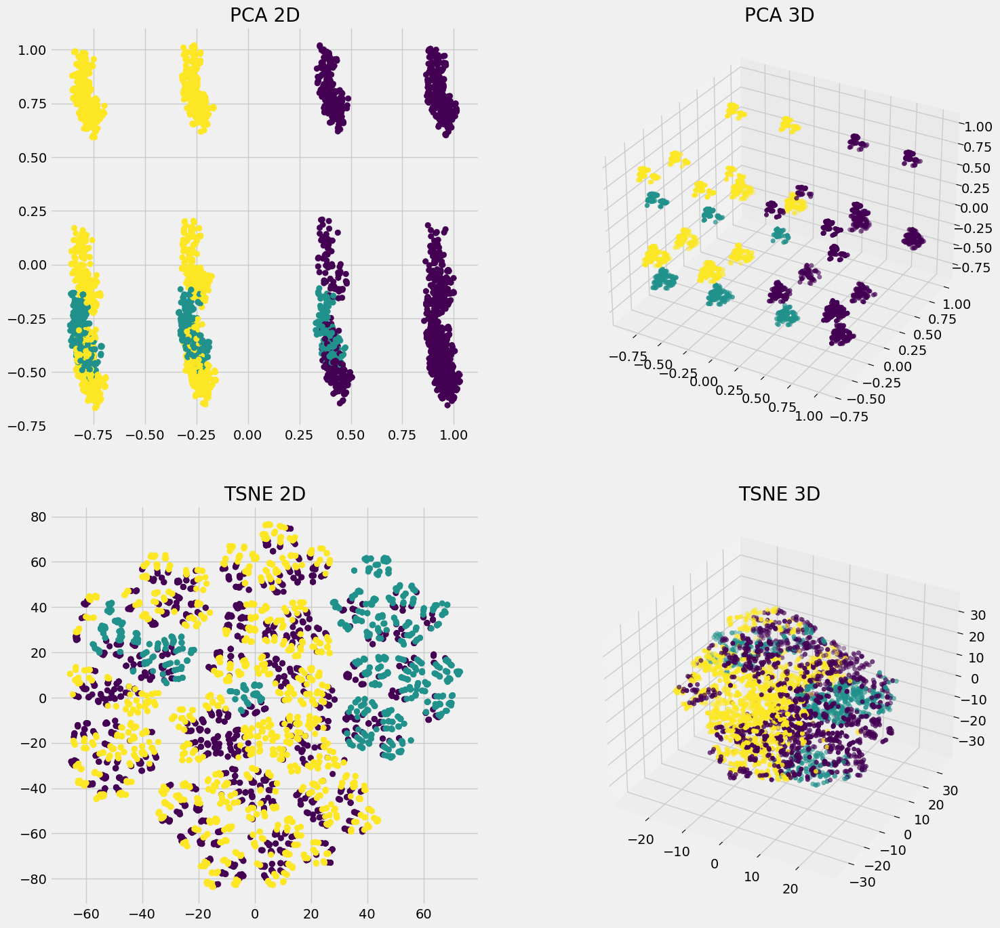

In [132]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2, projection='3d')
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, projection='3d')

plot_clusters(dataset_pca, c_labels3, ax=(ax1, ax2, ax3, ax4))

In [133]:
dataset = dataset_grouped.copy(deep=True)
dataset["cluster"] = c_labels3
dataset["cluster"].value_counts()

cluster
2    1597
0    1514
1     789
Name: count, dtype: int64

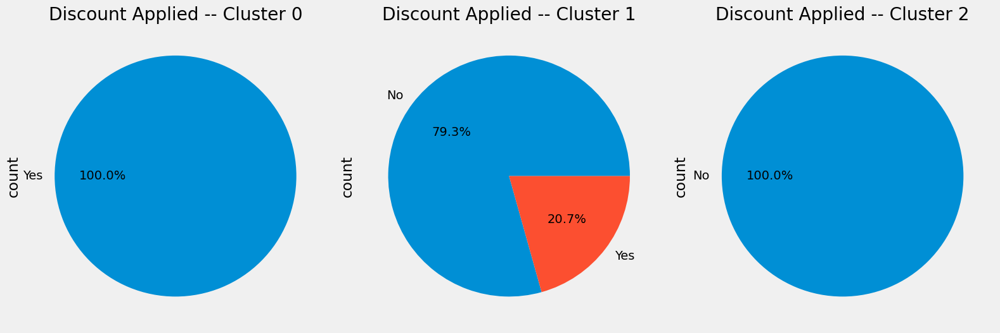

In [134]:
fig, ax = plt.subplots(1, 3, figsize=(16, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Discount Applied"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Discount Applied -- Cluster {cluster_id}")

fig.tight_layout()

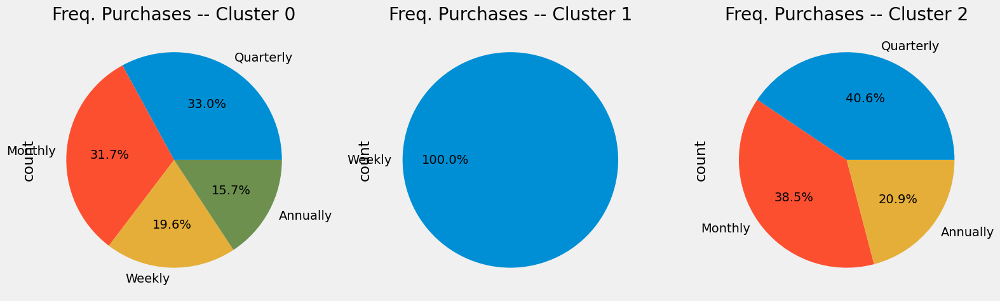

In [135]:
fig, ax = plt.subplots(1, 3, figsize=(16, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Frequency of Purchases"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Freq. Purchases -- Cluster {cluster_id}")

fig.tight_layout()

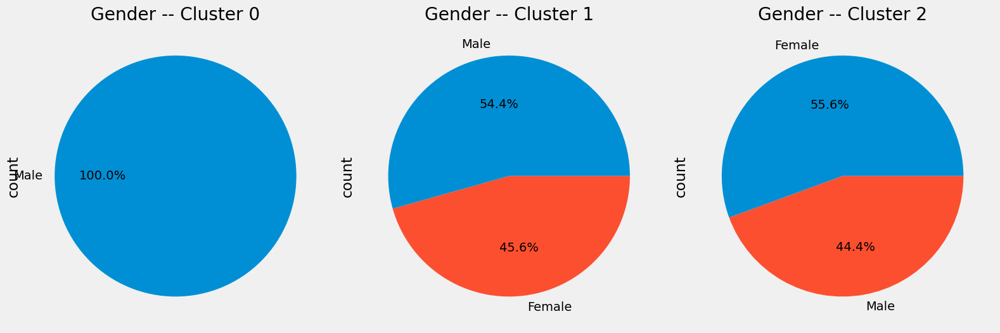

In [136]:
fig, ax = plt.subplots(1, 3, figsize=(16, 12))
ax = ax.flatten()

for i, cluster_id in enumerate(dataset["cluster"].sort_values().unique()):
    dataset[dataset["cluster"] == cluster_id]["Gender"].value_counts().plot(kind="pie", autopct="%1.1f%%", ax=ax[i], title=f"Gender -- Cluster {cluster_id}")

fig.tight_layout()

Text(0.5, 1.0, 'Cluster -- Others')

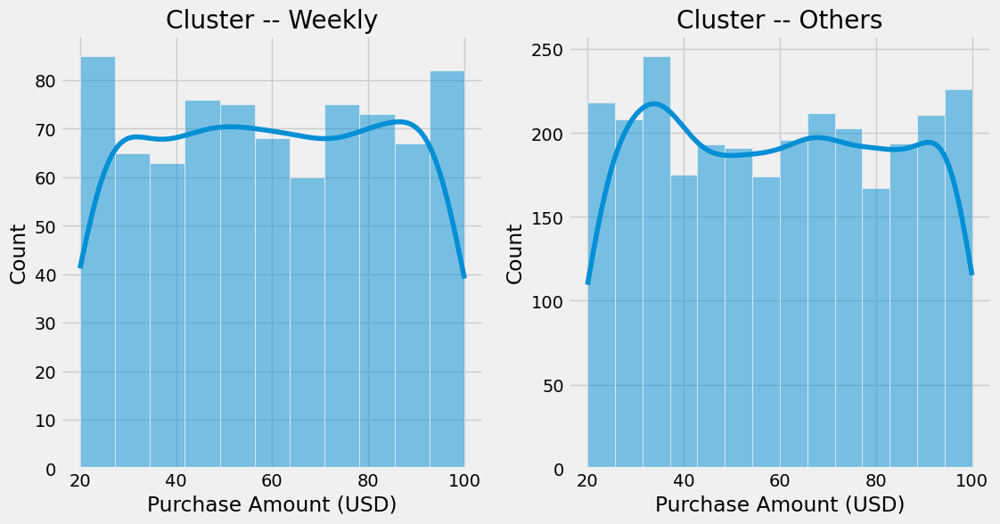

In [146]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(dataset[dataset["cluster"] == 1], x="Purchase Amount (USD)", kde=True, ax=ax[0])
ax[0].set_title("Cluster -- Weekly")
sns.histplot(dataset[(dataset["cluster"] != 1) & (dataset["Frequency of Purchases"] != "Weekly")], x="Purchase Amount (USD)", kde=True, ax=ax[1])
ax[1].set_title("Cluster -- Others")

Kupci koji kupuju jednom nedeljno cesce kupuju jeftinije namirnice u odnosu na ostale.

Text(0.5, 1.0, 'Cluster -- Others')

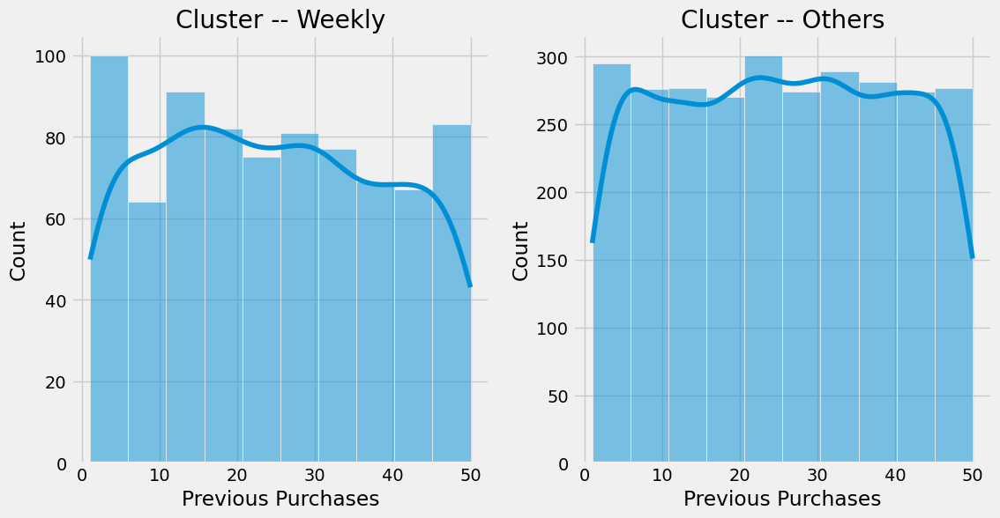

In [148]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(dataset[dataset["cluster"] == 1], x="Previous Purchases", kde=True, ax=ax[0], bins=10)
ax[0].set_title("Cluster -- Weekly")
sns.histplot(dataset[(dataset["cluster"] != 1) & (dataset["Frequency of Purchases"] != "Weekly")], x="Previous Purchases", kde=True, ax=ax[1], bins=10)
ax[1].set_title("Cluster -- Others")

Postoji blagi trend da neki korisnici koji narucuju svake nedelje i nalaze se u klasteru 1 posle nekog vremena prestanu da narucuju nove proizvode, sto zakljucujemo na osnovu raspodele sa slike. Korisnici koji imaju vise od 30 porudzbina uglavnom ne narucuju svake nedelje.

Text(0.5, 1.0, 'Cluster != 1-- Others')

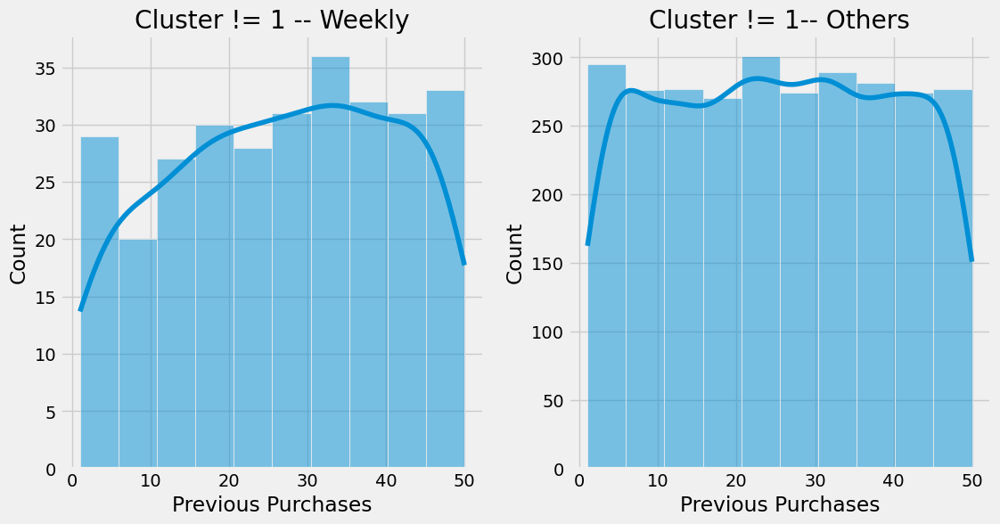

In [149]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(dataset[(dataset["cluster"] != 1) & (dataset["Frequency of Purchases"] == "Weekly")], x="Previous Purchases", kde=True, ax=ax[0], bins=10)
ax[0].set_title("Cluster != 1 -- Weekly")
sns.histplot(dataset[(dataset["cluster"] != 1) & (dataset["Frequency of Purchases"] != "Weekly")], x="Previous Purchases", kde=True, ax=ax[1], bins=10)
ax[1].set_title("Cluster != 1-- Others")